# Projekt 2 z przedmiotu MOW II

**Autorzy: Zuzanna Jużyniec, Rafał Matusiak**

Celem projektu jest przetworzenie danych biometrycznych zawartych w zbiorze Fantasia w postaci sygnałów, takich jak ECG, RESP i BP, poprzez ich filtrację, odszumianie i resampling. Następnie, na przetworzonych sygnałach, zostaną wyciągnięte istotne cechy (takie jak średnia, odchylenie standardowe, energia falkowa) w celu wykorzystania tych danych do wytrenowania modelu predykcyjnego.

Zbiór danych Fantasia dostępny na platformie PhysioNet [ https://physionet.org/content/fantasia/1.0.0/  ]  zawiera sygnały biometryczne, które zostały zebrane z dwóch grup osób: młodszych (poniżej 35 roku życia) i starszych (powyżej 60 roku życia). Obejmuje dane z kilku typów sygnałów, takich jak:

- ECG - sygnał elektrokardiograficzny, który rejestruje aktywność elektryczną serca;
- RESP - sygnał oddechowy, monitorujący zmiany w oddechu;
- BP - sygnał ciśnienia krwi, używany do oceny siły krwi przepływającej przez tętnice.

Dwadzieścia młodych (21 - 34 lat) i dwadzieścia starszych (68 - 85 lat) zdrowych osób poddano rygorystycznym badaniom przesiewowym przez 120 minut ciągłego spoczynku na wznak, podczas gdy zbierano ciągłe sygnały elektrokardiograficzne (EKG) i oddechowe; w połowie każdej grupy nagrania obejmowały również nieskalibrowany ciągły nieinwazyjny sygnał ciśnienia krwi. Każda podgrupa badanych obejmuje równą liczbę mężczyzn i kobiet.

Wszyscy badani pozostawali w stanie spoczynku w rytmie zatokowym podczas oglądania filmu Fantasia (Disney, 1940), aby pomóc w utrzymaniu czuwania. Ciągłe sygnały EKG, oddechu i (jeśli były dostępne) ciśnienia krwi były digitalizowane z częstotliwością 250 Hz. Każde uderzenie serca zostało opatrzone adnotacją przy użyciu zautomatyzowanego algorytmu wykrywania arytmii, a każda adnotacja została zweryfikowana wizualnie.

Każdy rekord zawiera:
- Sygnał: dane w postaci analogowych sygnałów.
- Metadane: takie jak wiek, płeć pacjenta, oraz szczegóły dotyczące rekordów (np. częstotliwość próbkowania, nazwy sygnałów).

In [1]:
pip install pywavelets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 24.1 MB/s eta 0:00:00


In [2]:
pip install wfdb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.0/160.0 kB 3.3 MB/s eta 0:00:00


### Import potrzebnych bibliotek

In [3]:
import wfdb
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pywt
import librosa
import scipy
from scipy import signal
from scipy.signal import butter, filtfilt, hilbert, find_peaks
from librosa.feature import mfcc, chroma_stft, spectral_centroid, spectral_bandwidth, spectral_contrast
from librosa.feature import zero_crossing_rate
from librosa.effects import time_stretch

### Wczytanie i wizualizacja danych

Patient Record: f1y01
  - Age: 23
  - Sex: F
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 8710


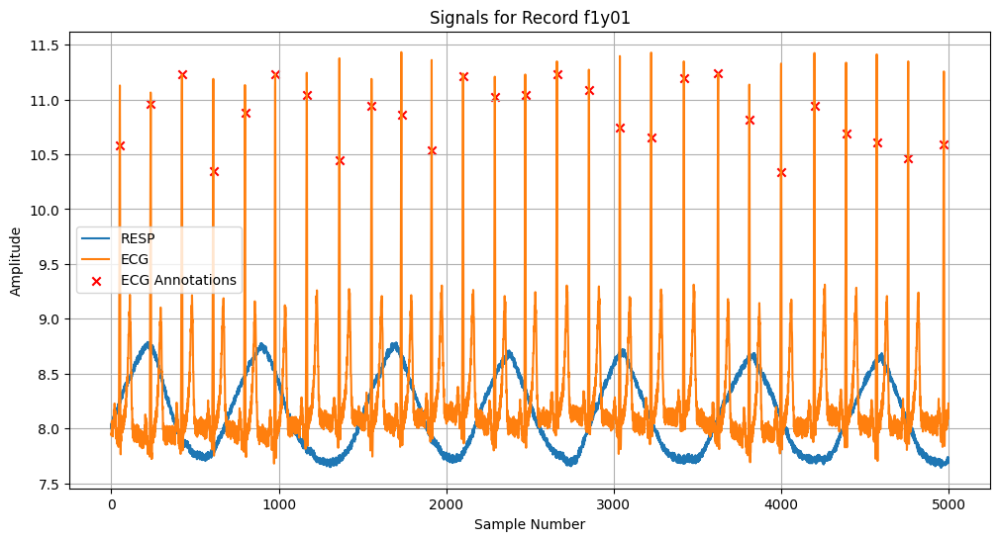

Patient Record: f1y02
  - Age: 28
  - Sex: F
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 7038


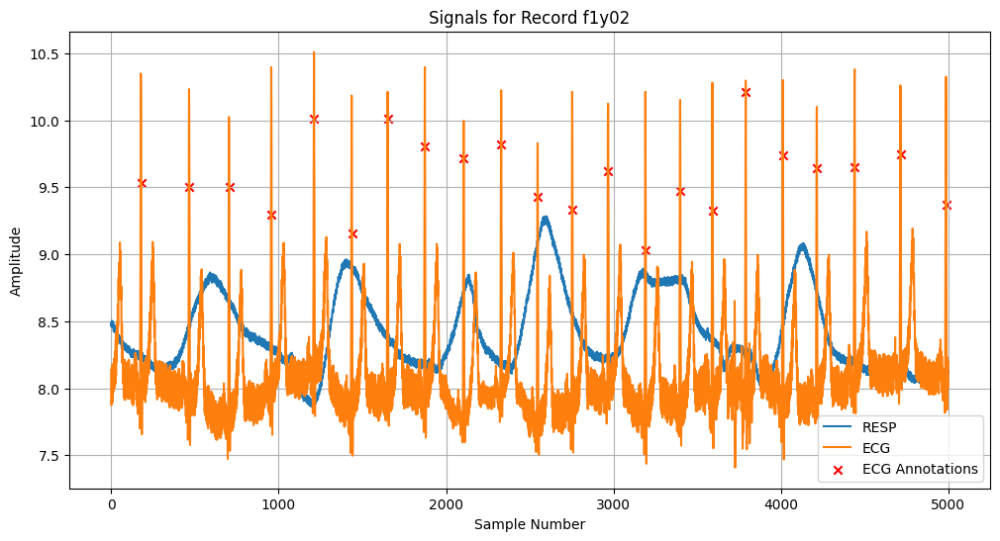

Patient Record: f1y03
  - Age: 34
  - Sex: M
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 7643


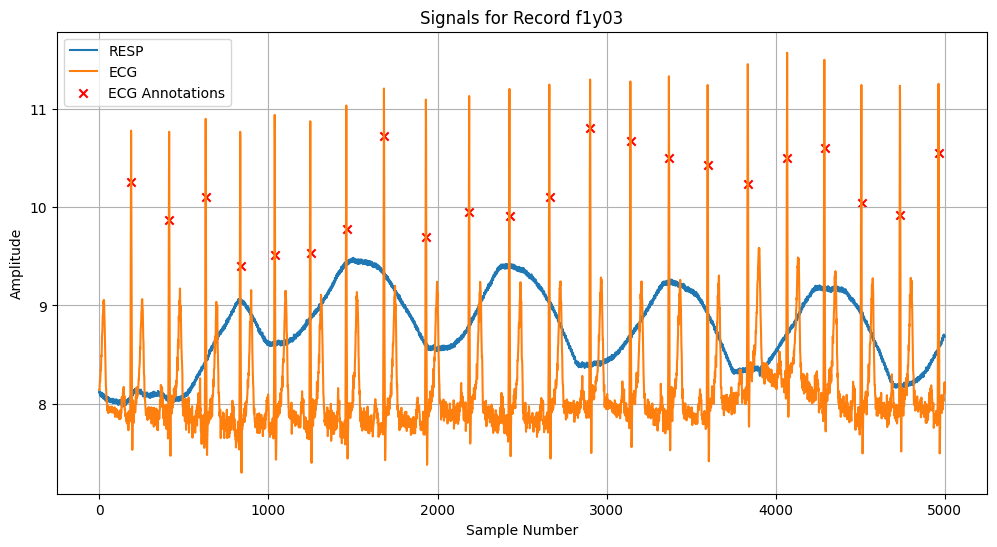

Patient Record: f1y04
  - Age: 31
  - Sex: M
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 5511


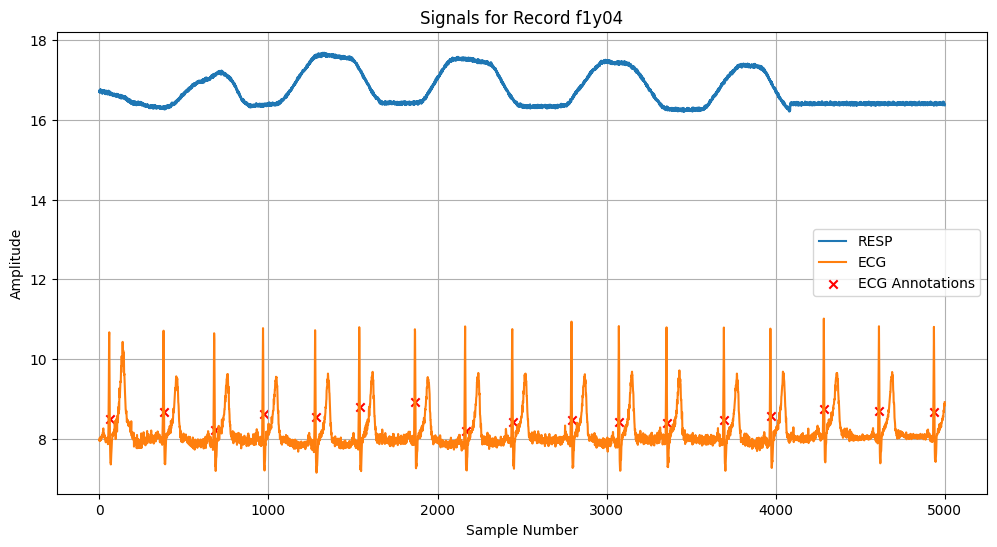

Patient Record: f1y05
  - Age: 23
  - Sex: M
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 6965


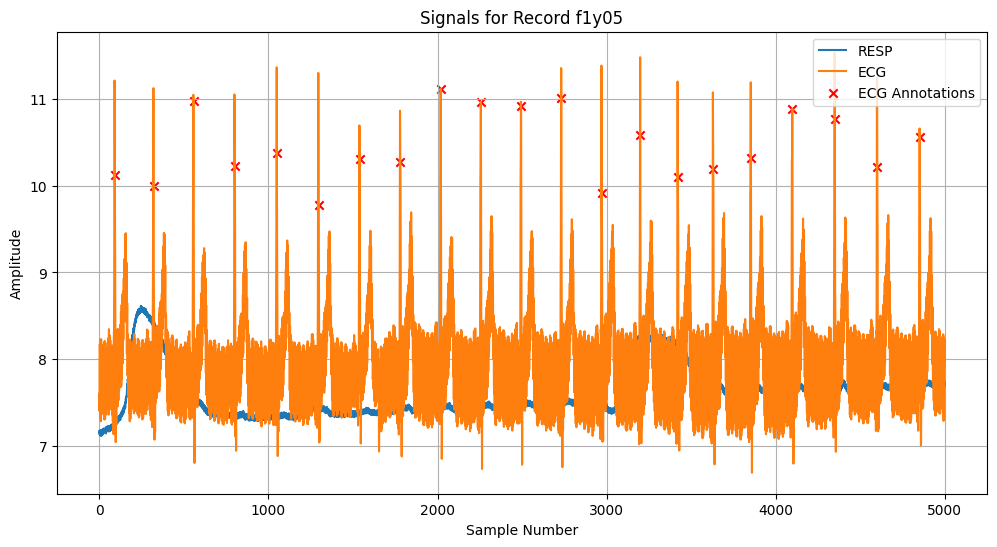

Patient Record: f1y06
  - Age: 30
  - Sex: M
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 7086


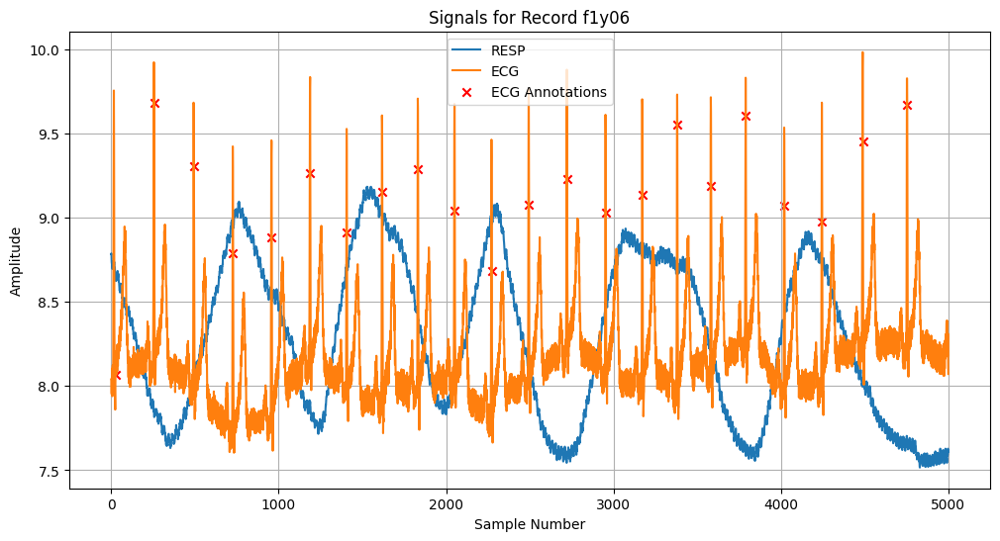

Patient Record: f1y07
  - Age: 21
  - Sex: M
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 5950


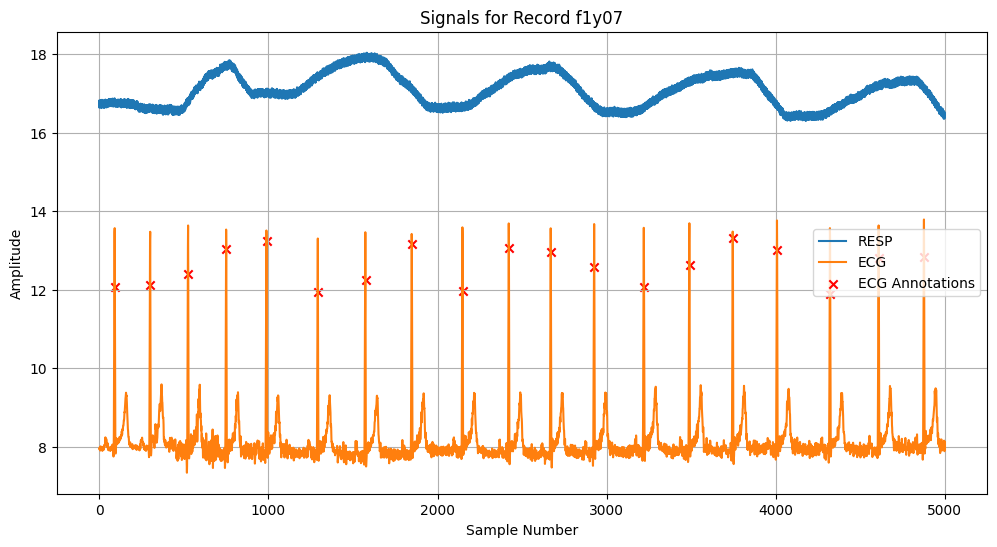

Patient Record: f1y08
  - Age: 30
  - Sex: F
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 7289


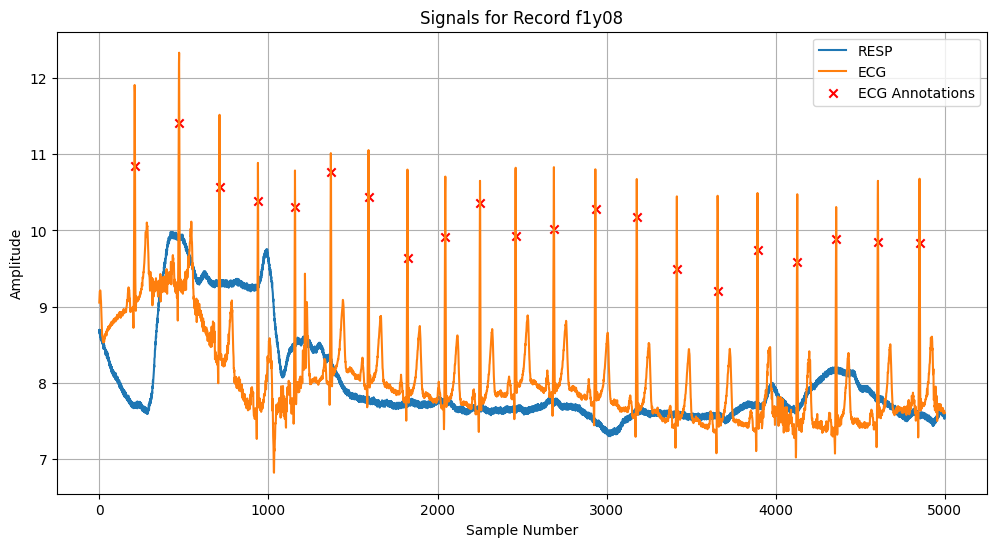

Patient Record: f1y09
  - Age: 32
  - Sex: F
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 8021


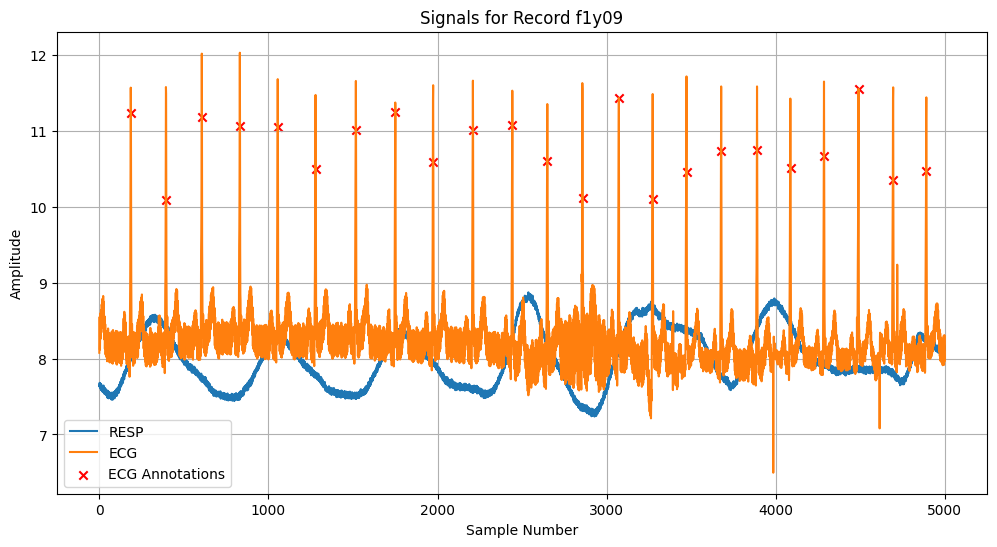

Patient Record: f1y10
  - Age: 21
  - Sex: F
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 8707


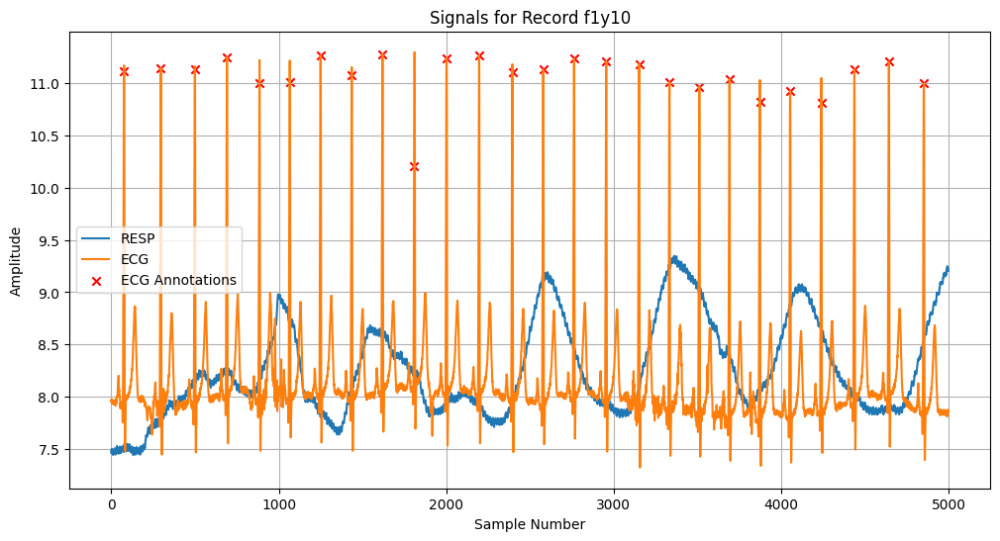

Patient Record: f2y01
  - Age: 23
  - Sex: F
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 8106


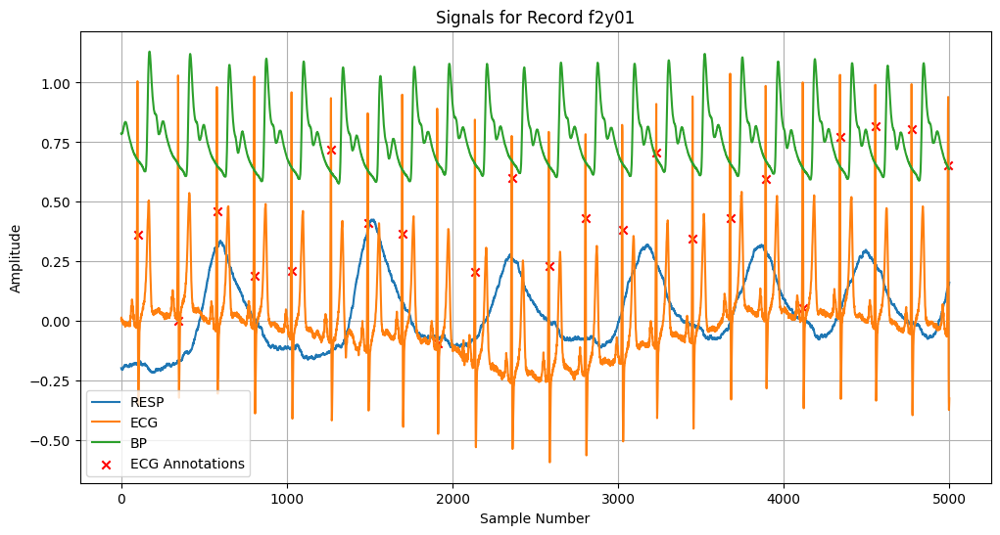

Patient Record: f2y02
  - Age: 23
  - Sex: M
  - Number of Channels: 3
  - Sampling Frequency: 333 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 6574


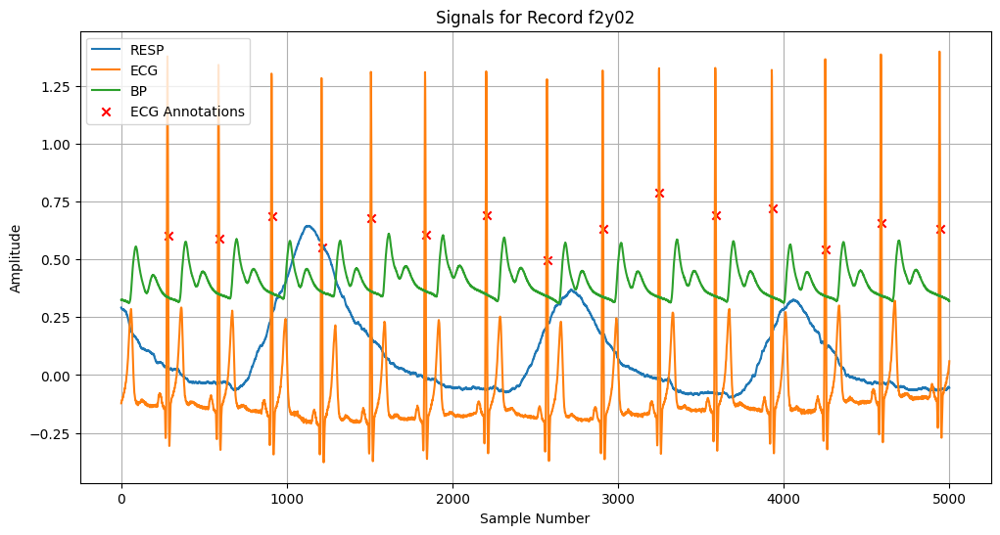

Patient Record: f2y03
  - Age: 28
  - Sex: F
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 6807


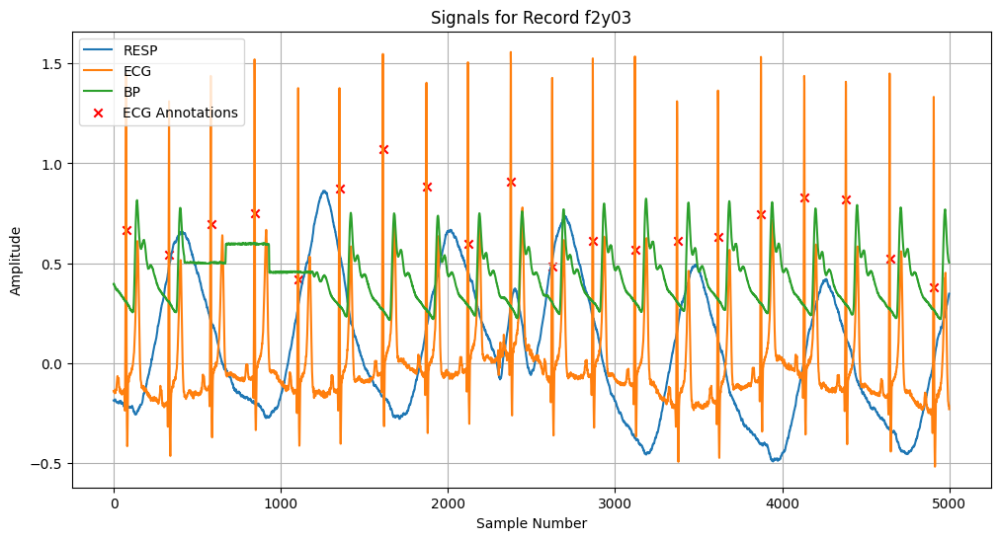

Patient Record: f2y04
  - Age: 27
  - Sex: F
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 8603


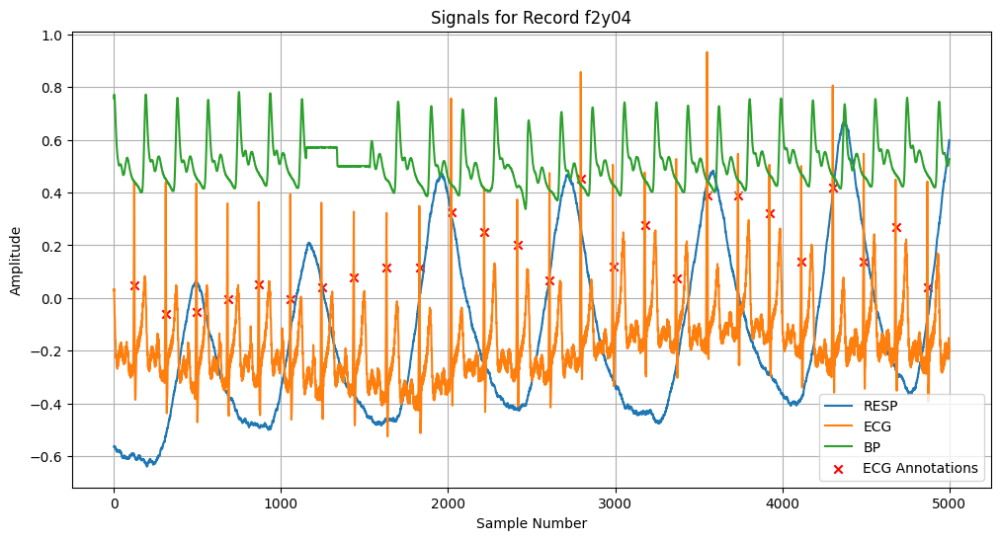

Patient Record: f2y05
  - Age: 25
  - Sex: F
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 9248


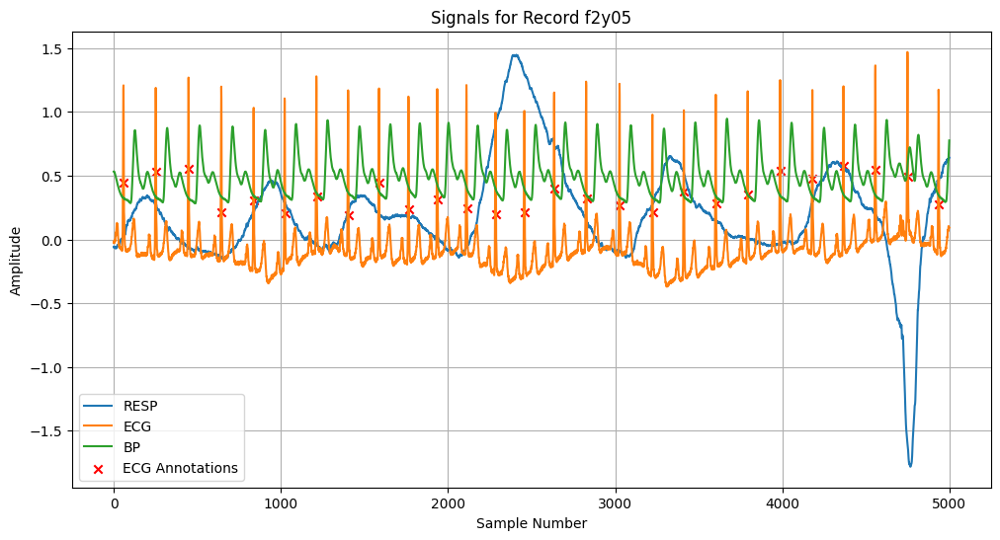

Patient Record: f2y06
  - Age: 26
  - Sex: M
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 6851


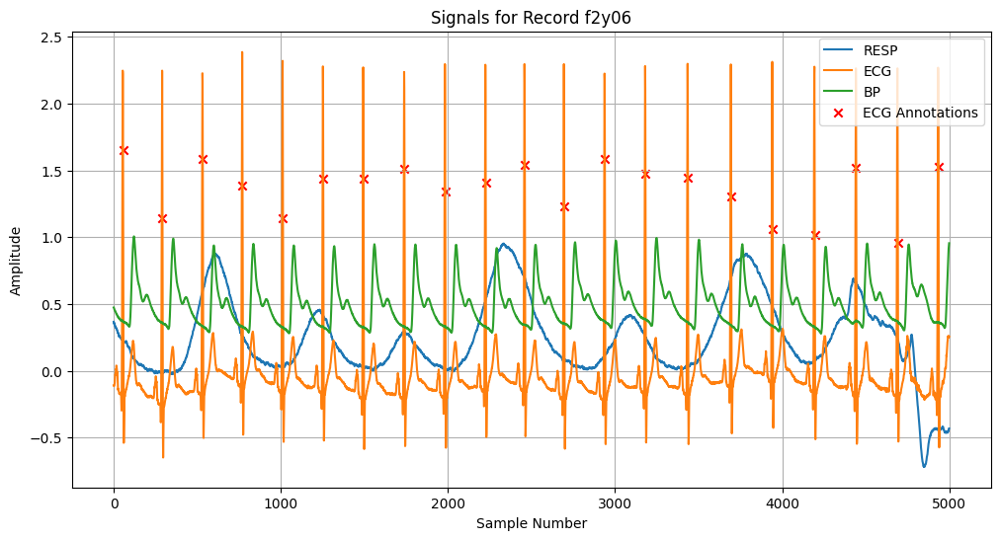

Patient Record: f2y07
  - Age: 31
  - Sex: M
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 6510


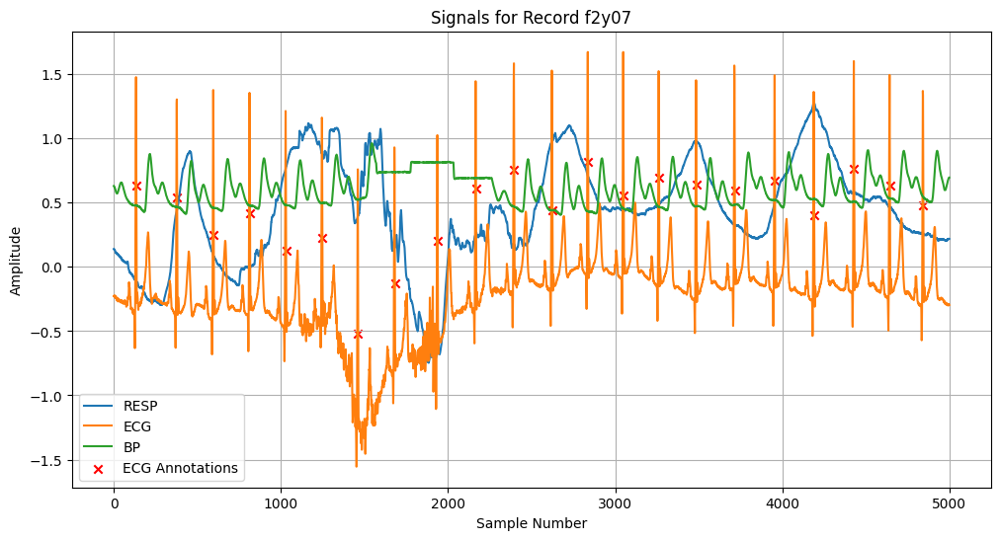

Patient Record: f2y08
  - Age: 21
  - Sex: M
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 7378


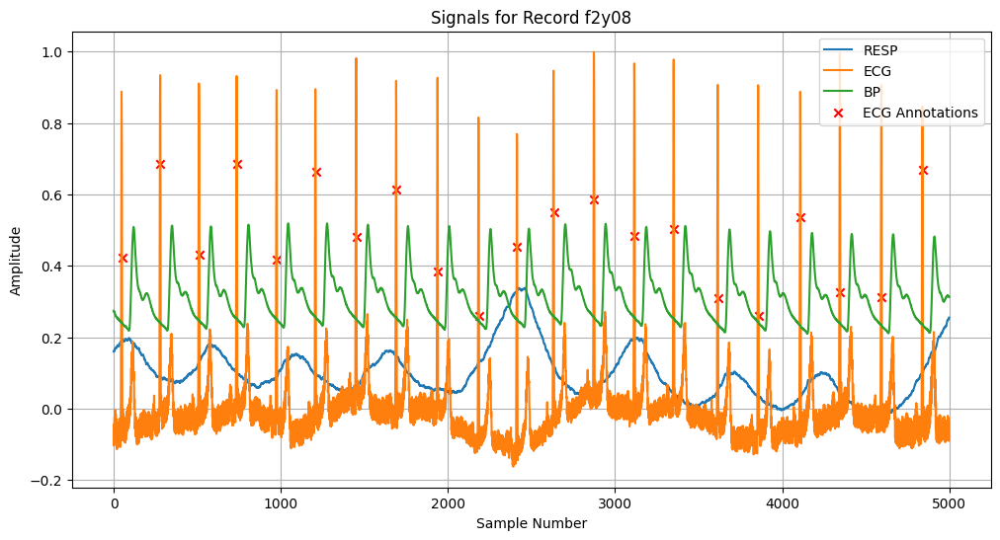

Patient Record: f2y09
  - Age: 21
  - Sex: F
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 8811


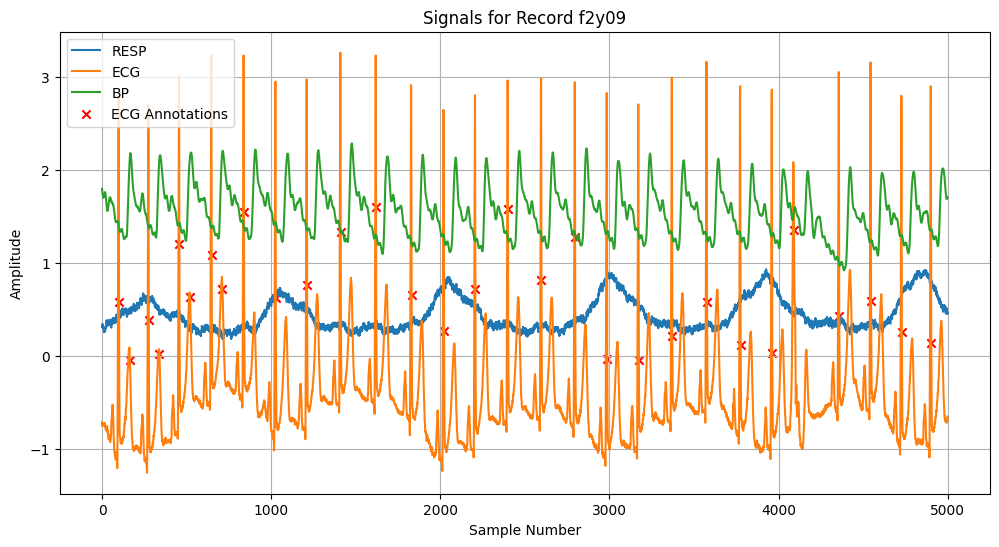

Patient Record: f2y10
  - Age: 21
  - Sex: M
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 7114


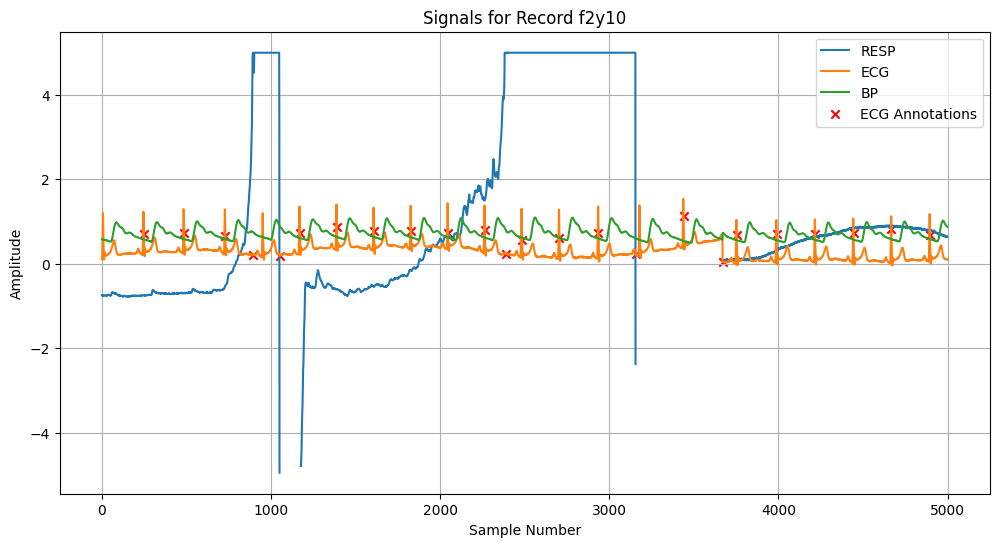

Patient Record: f1o01
  - Age: 77
  - Sex: F
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 7169


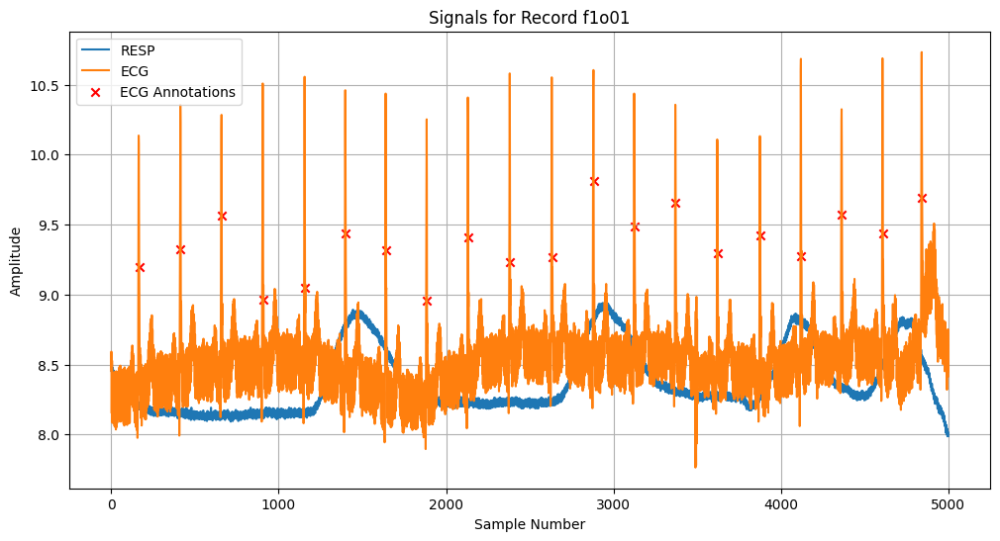

Patient Record: f1o02
  - Age: 73
  - Sex: F
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 6823


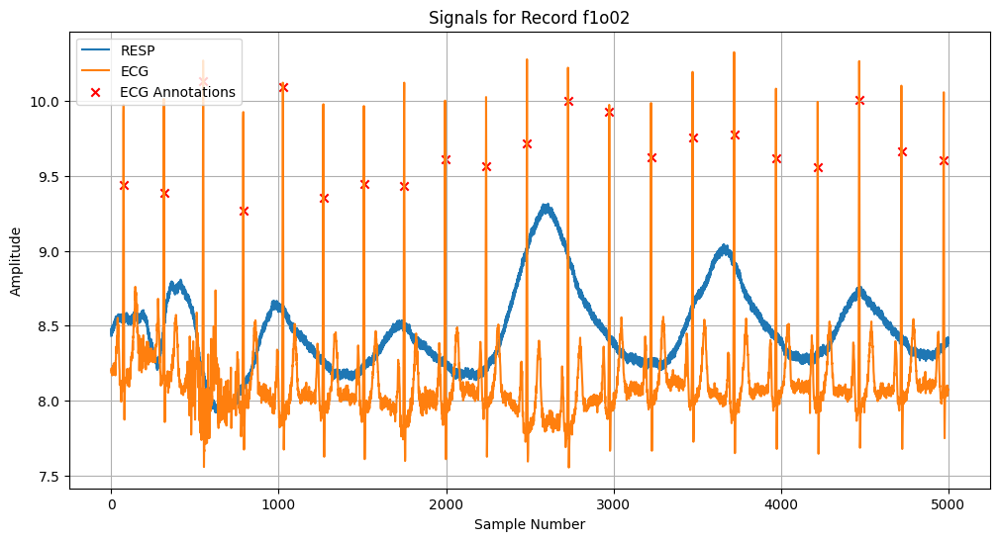

Patient Record: f1o03
  - Age: 73
  - Sex: M
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 7228


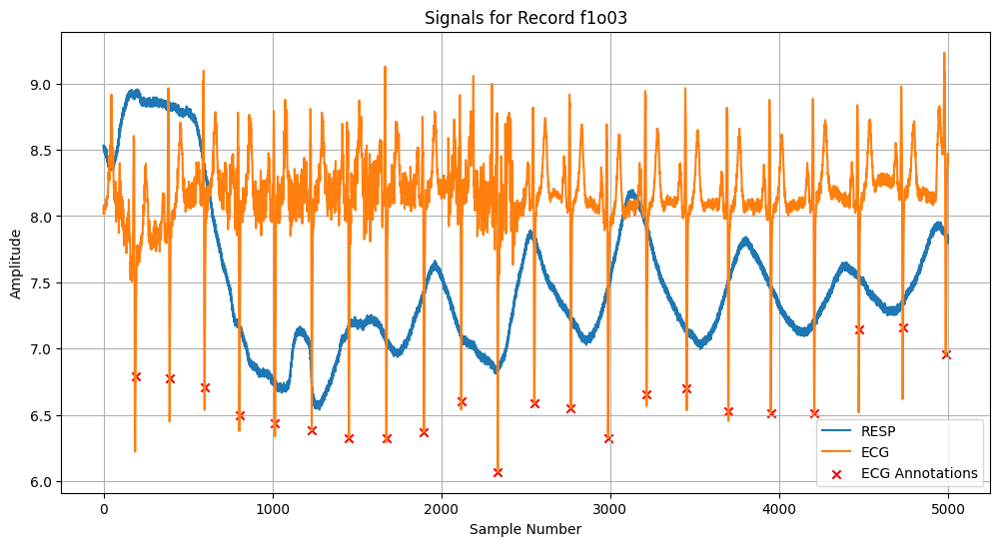

Patient Record: f1o04
  - Age: 81
  - Sex: M
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 6230


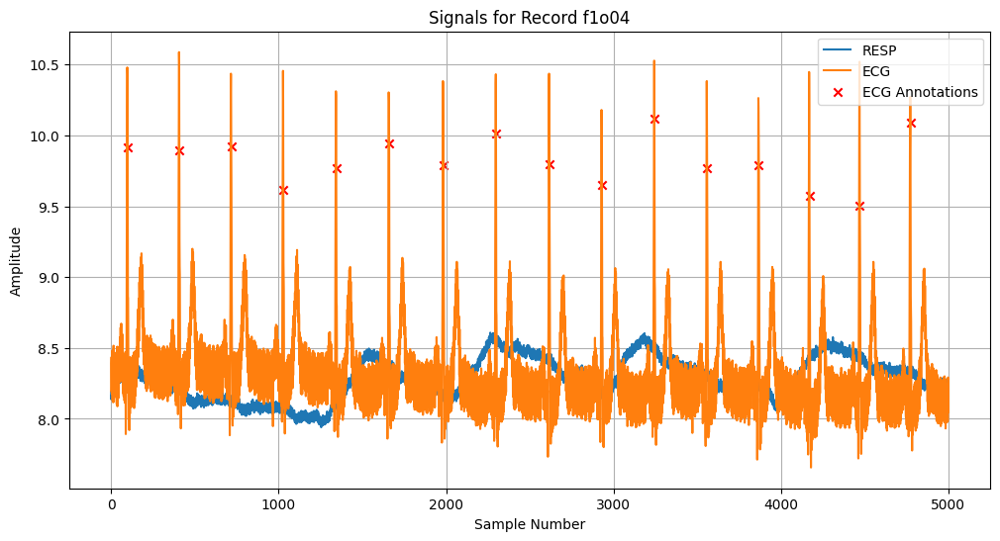

Patient Record: f1o05
  - Age: 76
  - Sex: M
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 5730


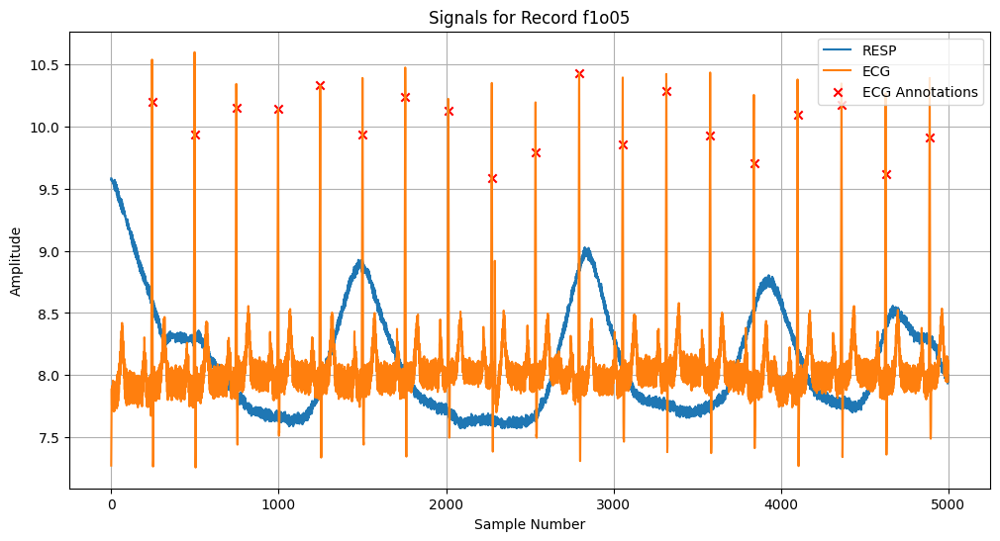

Patient Record: f1o06
  - Age: 74
  - Sex: F
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 6231


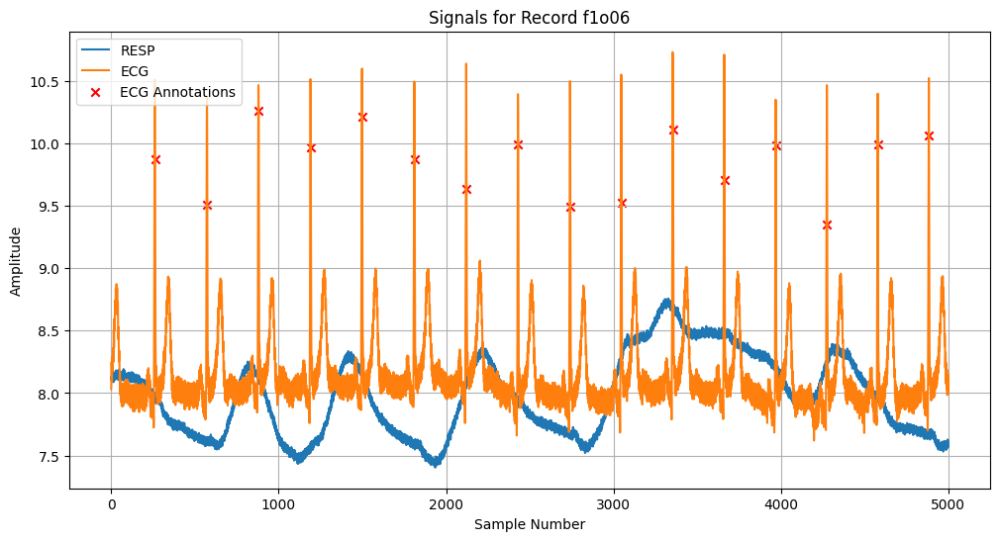

Patient Record: f1o07
  - Age: 68
  - Sex: M
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 7150


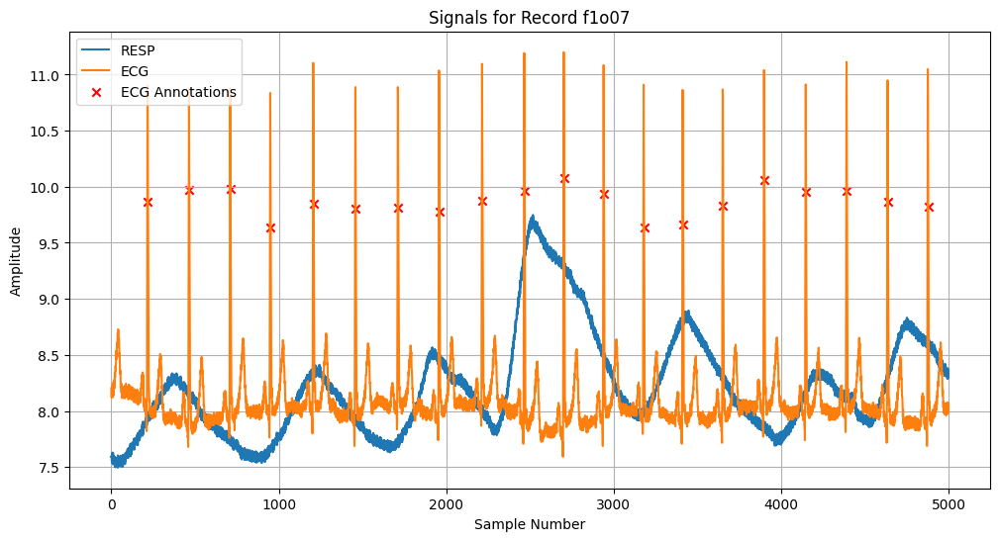

Patient Record: f1o08
  - Age: 73
  - Sex: F
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 8488


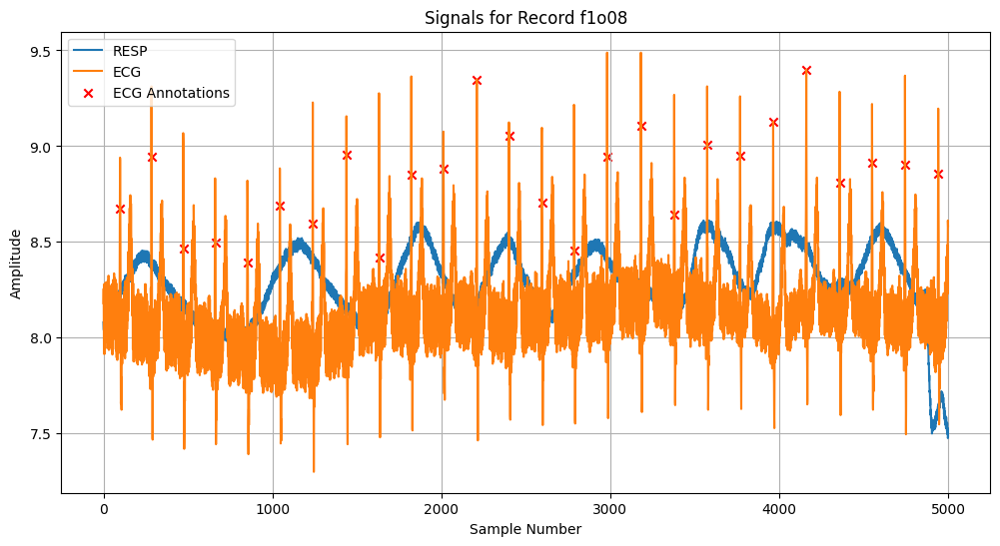

Patient Record: f1o09
  - Age: 71
  - Sex: M
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 4925


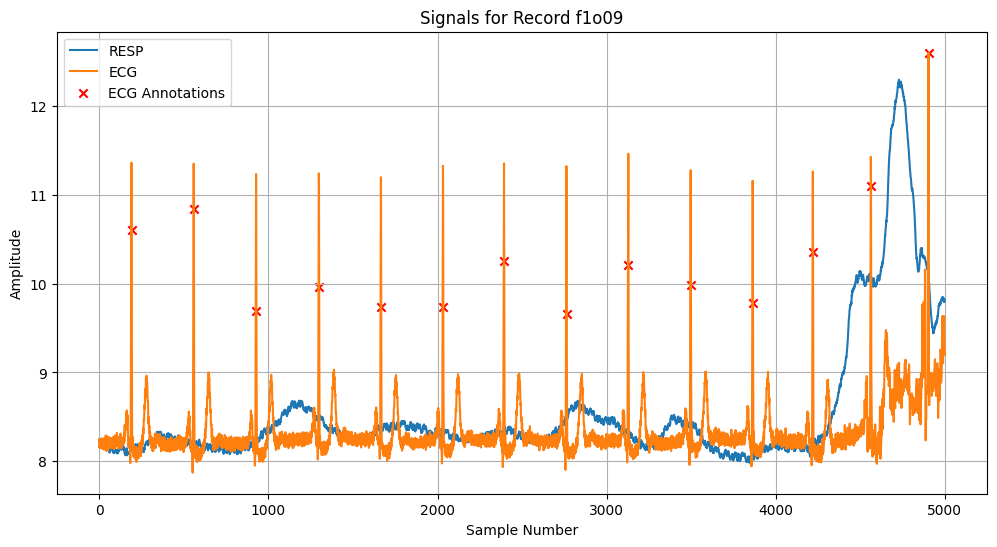

Patient Record: f1o10
  - Age: 71
  - Sex: F
  - Number of Channels: 2
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG
  - Number of Annotations: 8241


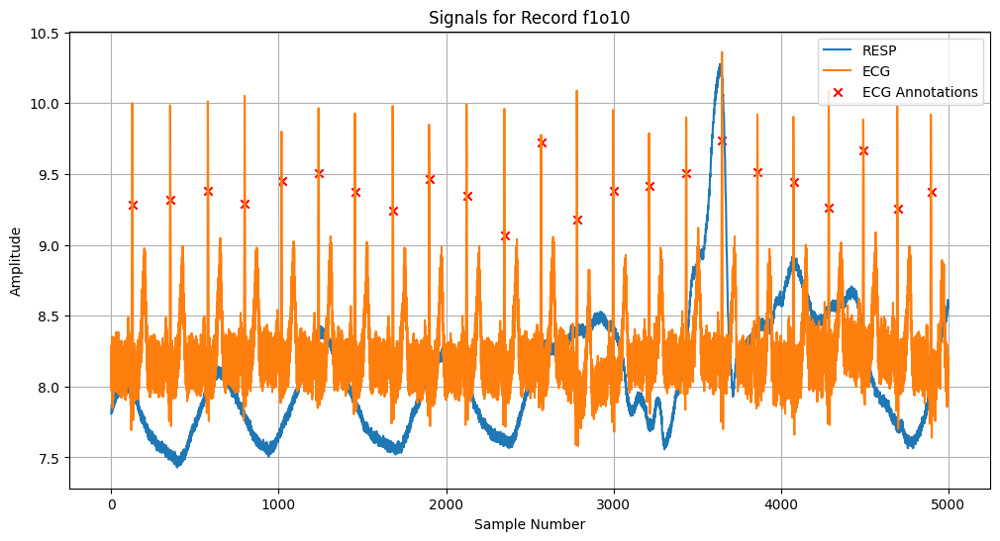

Patient Record: f2o01
  - Age: 73
  - Sex: F
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 7236


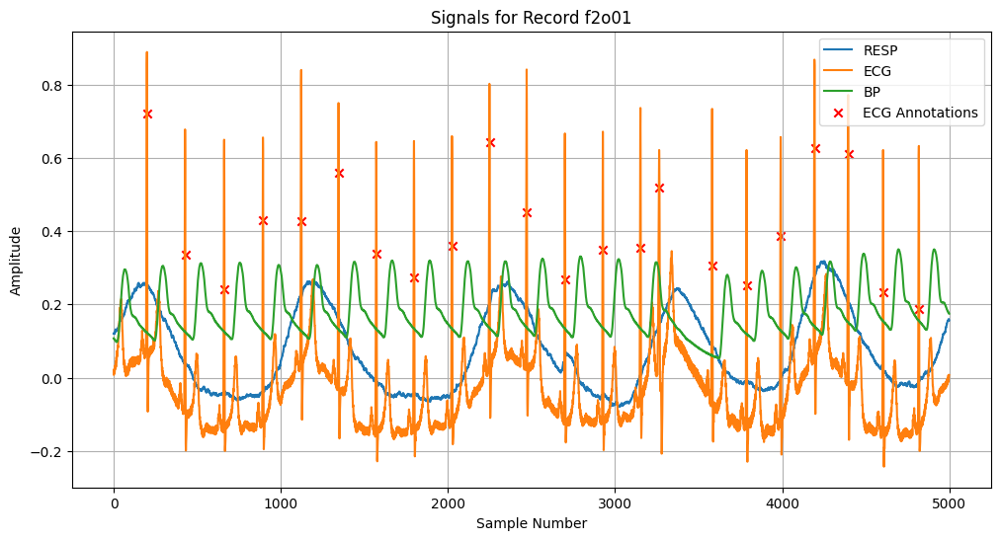

Patient Record: f2o02
  - Age: 75
  - Sex: F
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 6372


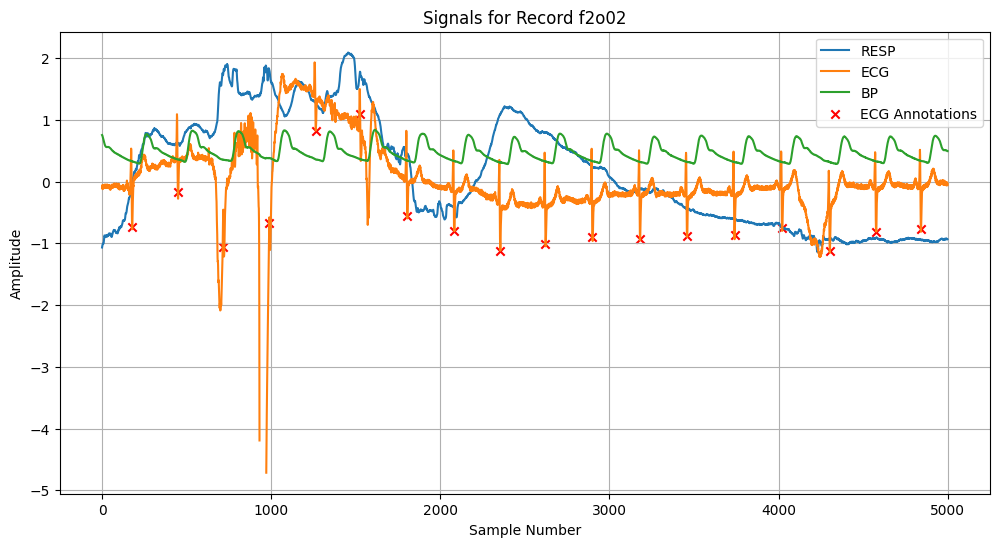

Patient Record: f2o03
  - Age: 85
  - Sex: F
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 6541


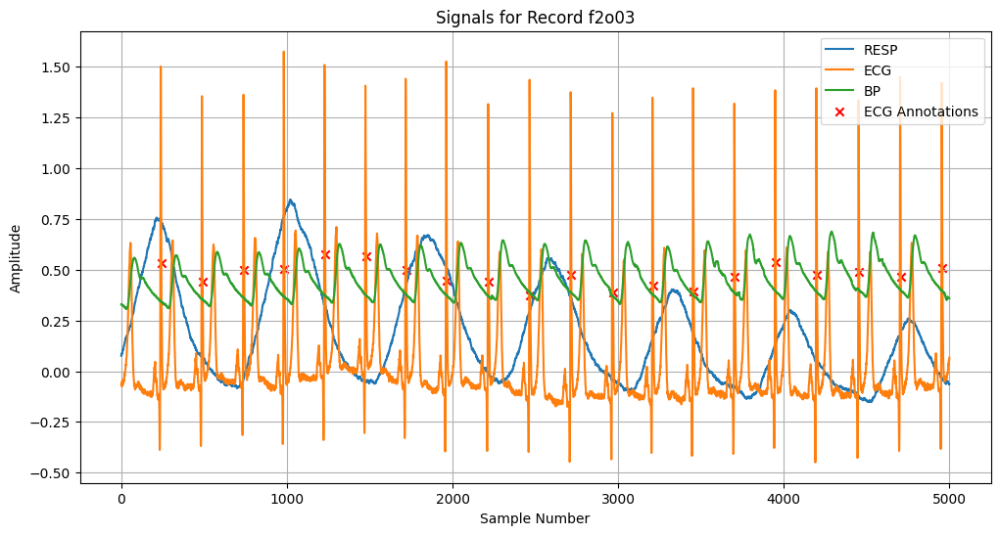

Patient Record: f2o04
  - Age: 70
  - Sex: F
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 6902


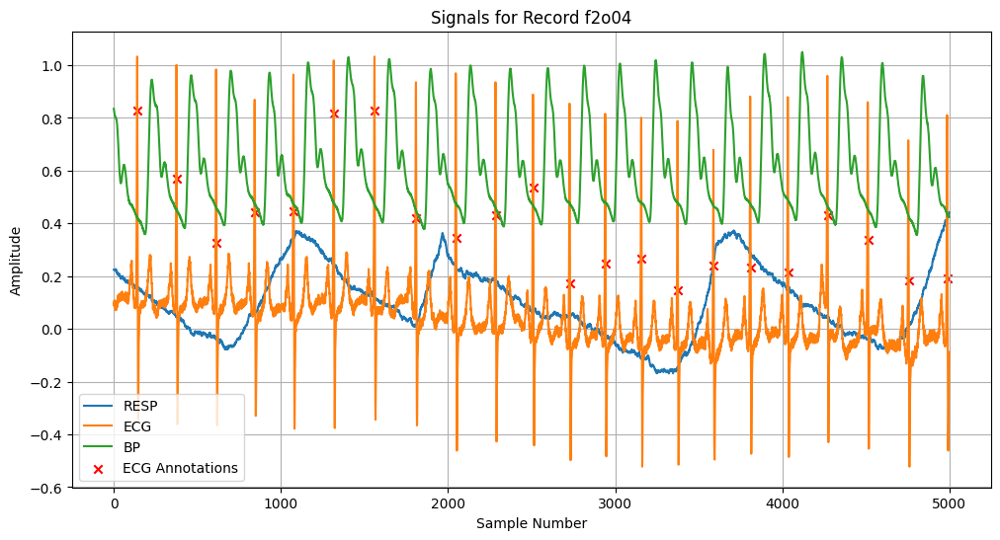

Patient Record: f2o05
  - Age: 83
  - Sex: M
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 8469


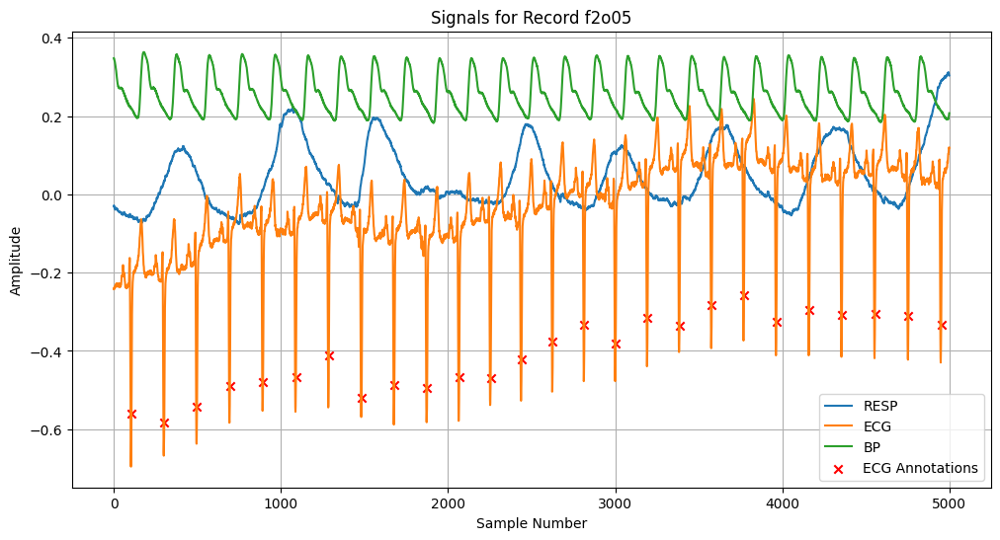

Patient Record: f2o06
  - Age: 70
  - Sex: M
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 5249


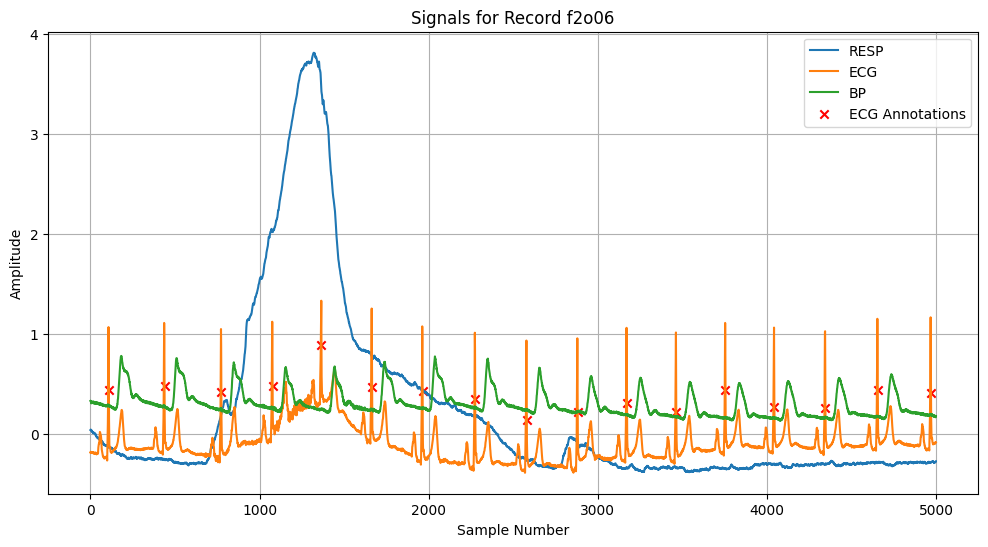

Patient Record: f2o07
  - Age: 77
  - Sex: M
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 5944


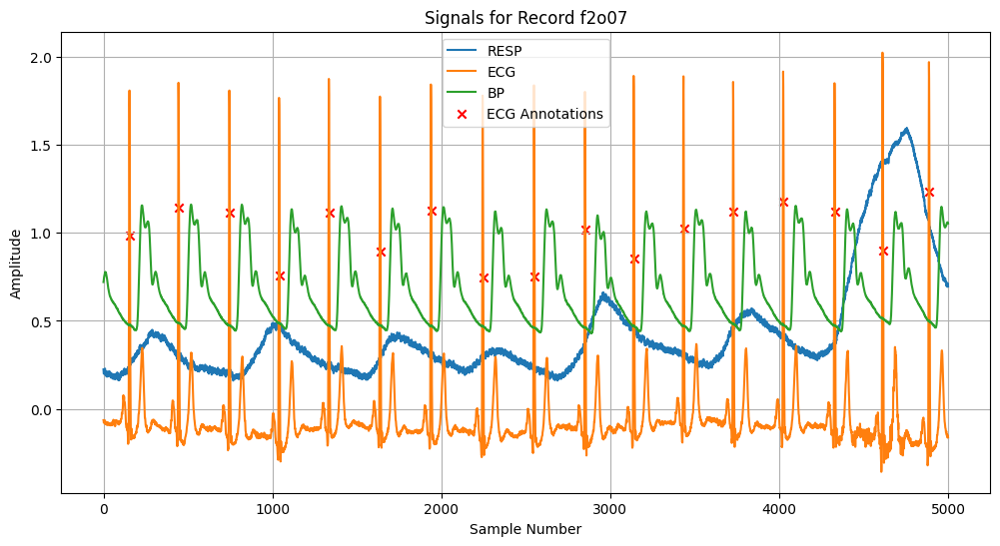

Patient Record: f2o08
  - Age: 71
  - Sex: M
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 7094


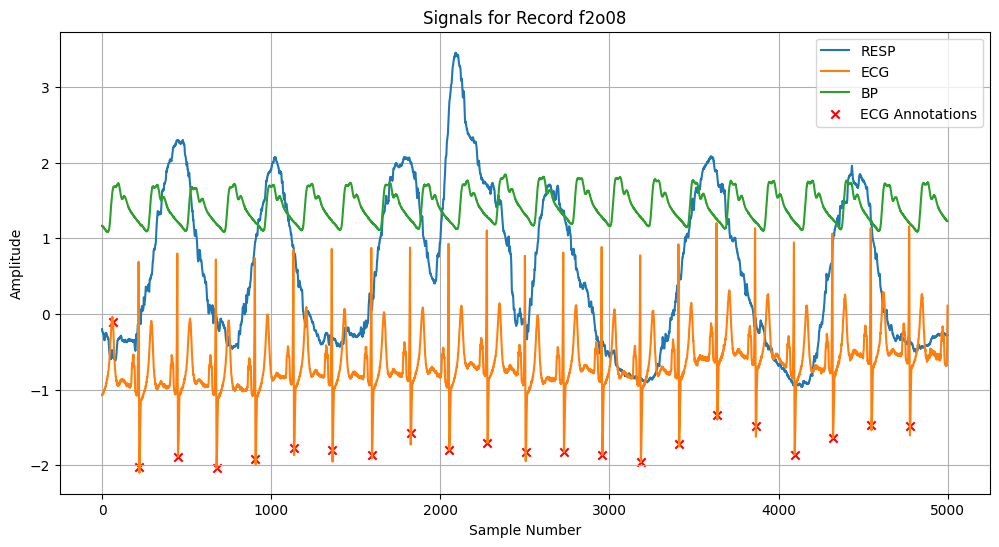

Patient Record: f2o09
  - Age: 77
  - Sex: M
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 6149


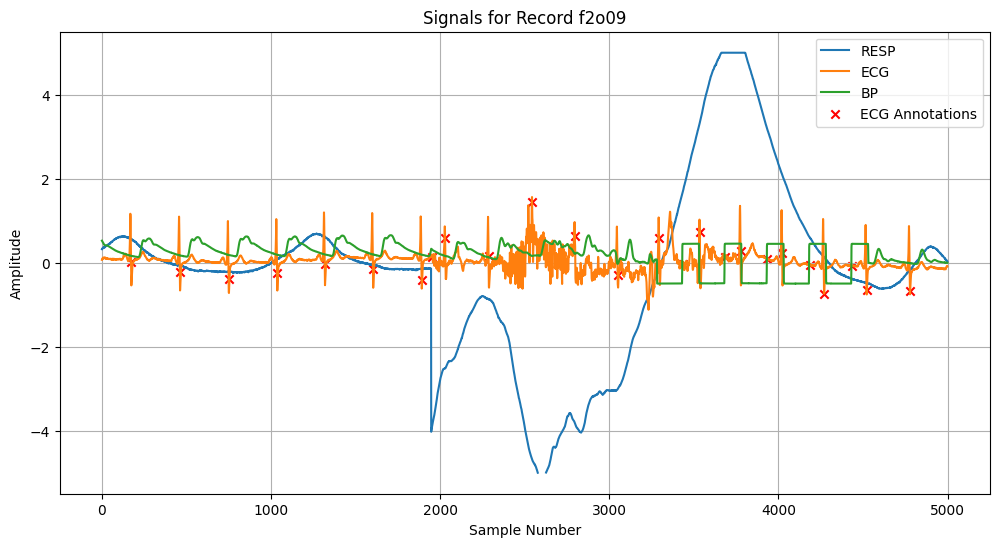

Patient Record: f2o10
  - Age: 73
  - Sex: F
  - Number of Channels: 3
  - Sampling Frequency: 250 Hz
  - Signal Names: RESP, ECG, BP
  - Number of Annotations: 8441


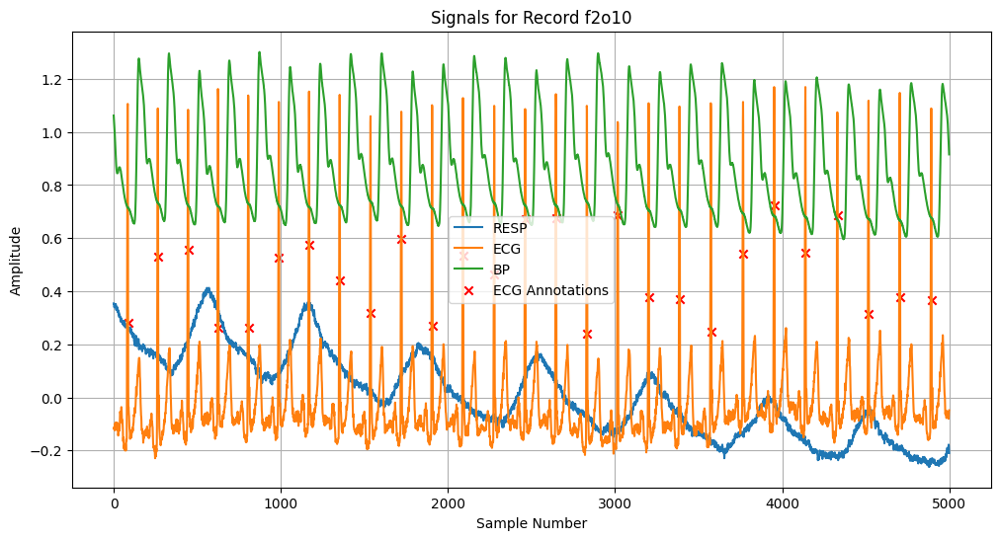

In [4]:
record_names = [
                   f'f1y{str(i).zfill(2)}' for i in range(1, 11)
               ] + [
                   f'f2y{str(i).zfill(2)}' for i in range(1, 11)
               ] + [
                   f'f1o{str(i).zfill(2)}' for i in range(1, 11)
               ] + [
                   f'f2o{str(i).zfill(2)}' for i in range(1, 11)
               ]


def get_patient_metadata(record_name):
    header = wfdb.rdheader(record_name, pn_dir='fantasia')
    age, sex = None, None

    for comment in header.comments:
        if 'Age:' in comment:
            age = comment.split('Age:')[-1].strip().split()[0]
        if 'Sex:' in comment:
            sex = comment.split('Sex:')[-1].strip().split()[0]
    return {
        "Age": age if age else "Unknown",
        "Sex": sex if sex else "Unknown",
        "Number of Channels": len(header.sig_name),
        "Sampling Frequency": header.fs,
        "Signal Names": header.sig_name
    }

def plot_signals(record_name):
    record = wfdb.rdrecord(record_name, pn_dir='fantasia')

    metadata = get_patient_metadata(record_name)

    print(f"Patient Record: {record_name}")
    print(f"  - Age: {metadata['Age']}")
    print(f"  - Sex: {metadata['Sex']}")
    print(f"  - Number of Channels: {metadata['Number of Channels']}")
    print(f"  - Sampling Frequency: {metadata['Sampling Frequency']} Hz")
    print(f"  - Signal Names: {', '.join(metadata['Signal Names'])}")

    try:
        annotation = wfdb.rdann(record_name, 'ecg', pn_dir='fantasia')
        print(f"  - Number of Annotations: {len(annotation.sample)}")
    except Exception as e:
        annotation = None
        print("  - No ECG annotations available or could not read the .ecg file.")

    signal_names = record.sig_name
    signals = record.p_signal

    plt.figure(figsize=(12, 6))
    for i, signal in enumerate(signals.T):
        plt.plot(signal[:5000], label=signal_names[i])

    if annotation:
        ecg_channel_index = signal_names.index('ECG') if 'ECG' in signal_names else 0
        annotation_samples = [s for s in annotation.sample if s < 5000]
        plt.scatter(annotation_samples,
                    [signals[s, ecg_channel_index] for s in annotation_samples],
                    color='red', label='ECG Annotations', marker='x')

    plt.title(f"Signals for Record {record_name}")
    plt.xlabel("Sample Number")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid()
    plt.show()


for record_name in record_names:
    plot_signals(record_name)

### Przetwarzanie danych
Szczegóły przekształceń:
 - przy tych danych nie ma potrzeby resamplingu, częstotliwość 250Hz jest ok
 - filtracja pasmowa - wiekszosc ladnie, ale czesc brzydko
 - segmentacja na stałe okna nie na występowanie peaków - cięzko było to zoptymalizować ze względu na kilka kanałów, okna 10 sekundowe
 - wyciagniecie cech:
    - tu opis cech wszystkie jakie mam

Przetwarzanie rekordu: f1y01 z 2 kanałami


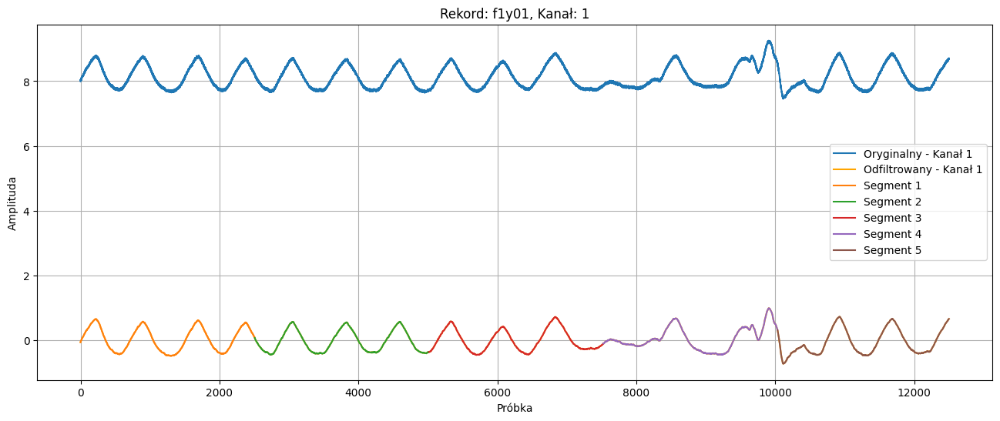

/usr/local/lib/python3.10/dist-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
<ipython-input-19-f02dd7e8dd2f>:171: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, segment_df], ignore_index=True)


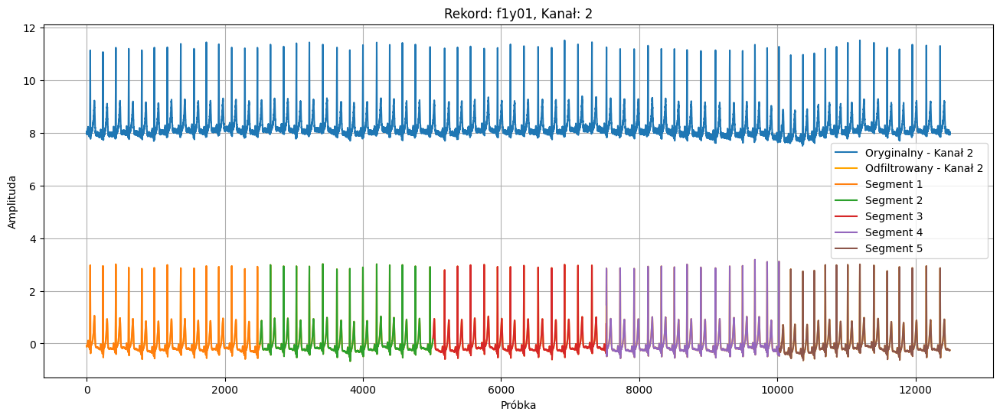

Przetwarzanie rekordu: f1y02 z 2 kanałami


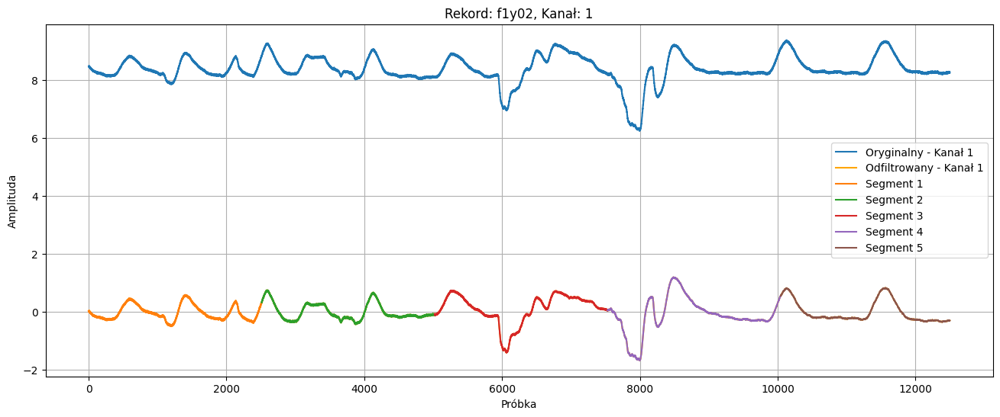

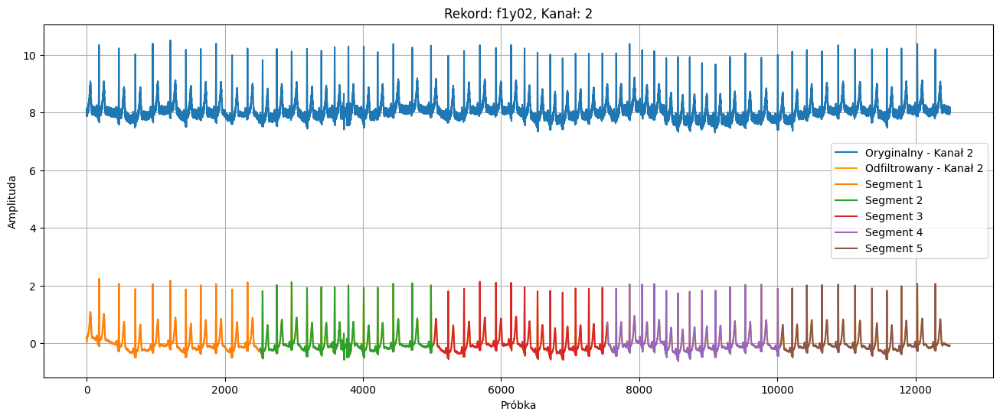

Przetwarzanie rekordu: f1y03 z 2 kanałami


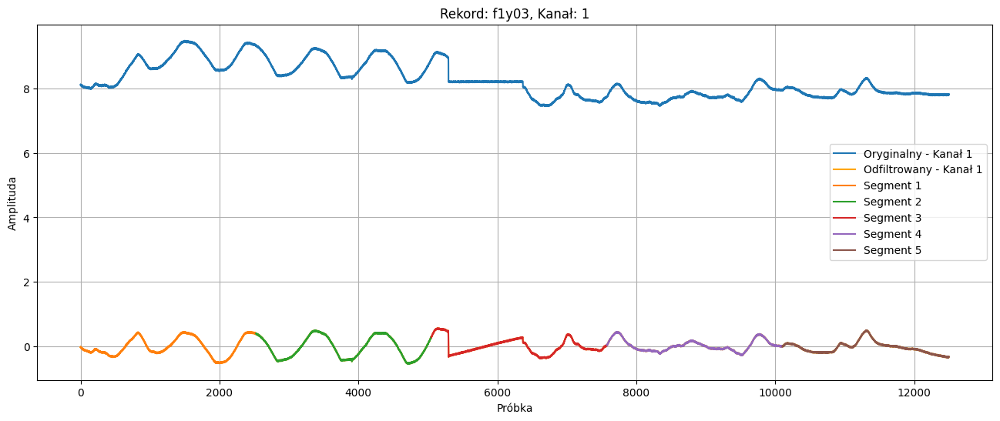

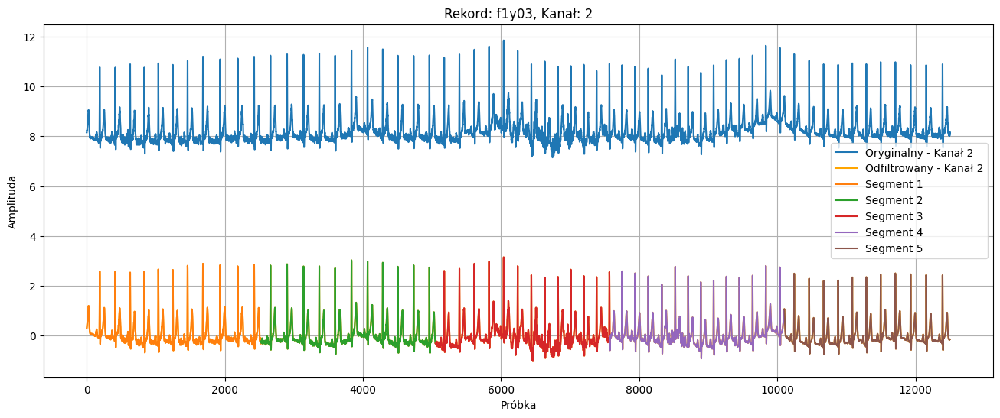

Przetwarzanie rekordu: f1y04 z 2 kanałami


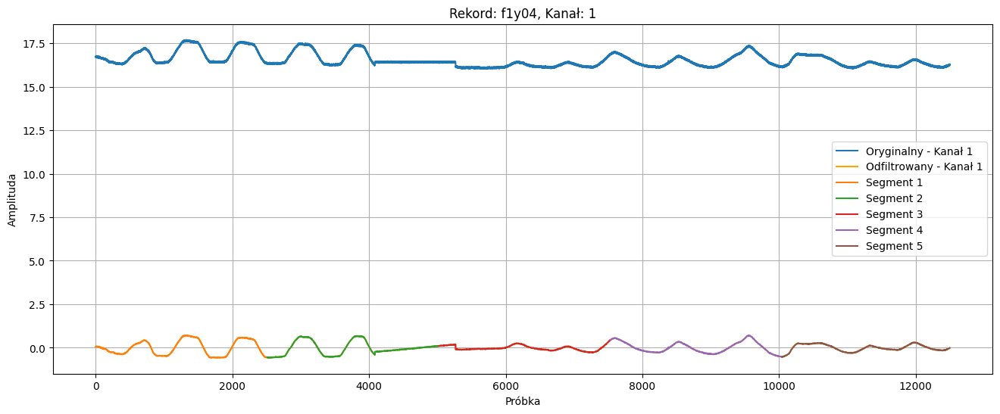

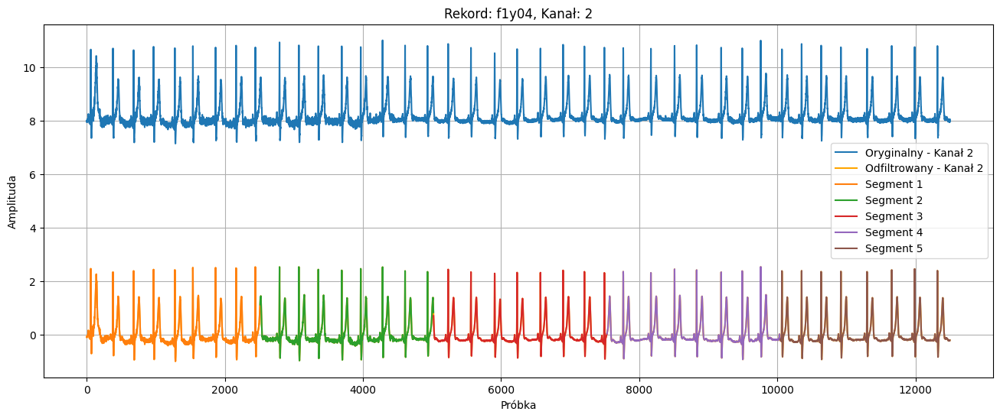

Przetwarzanie rekordu: f1y05 z 2 kanałami


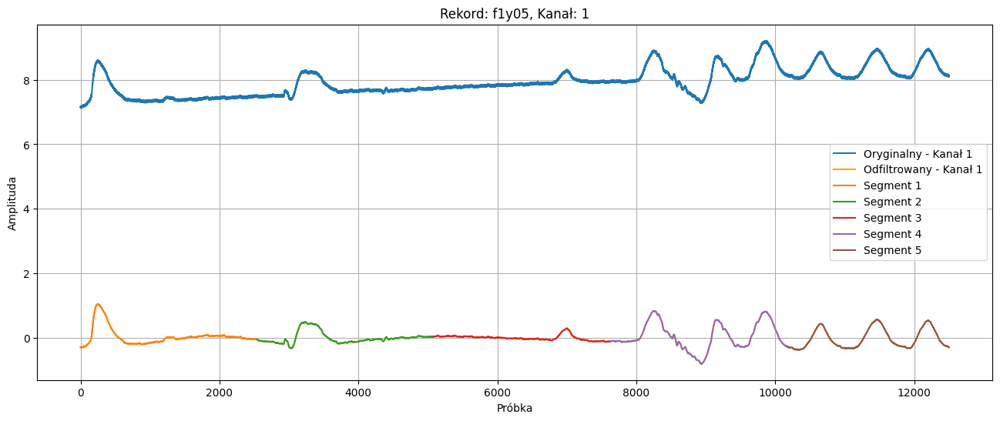

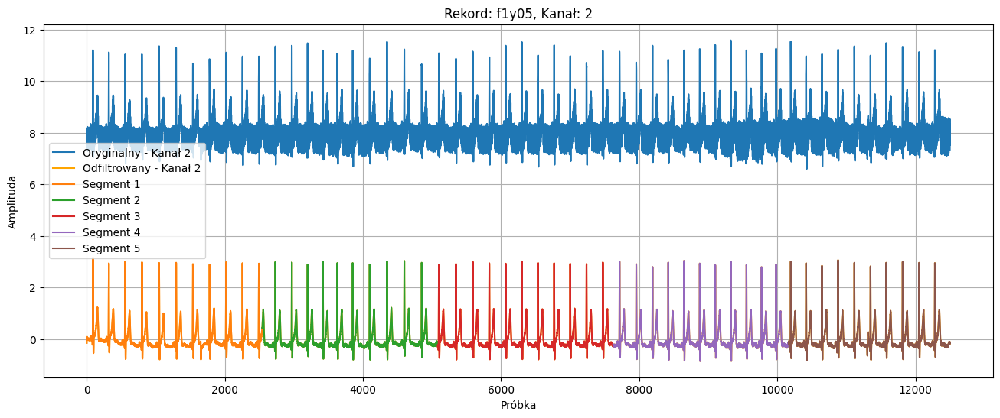

Przetwarzanie rekordu: f1y06 z 2 kanałami


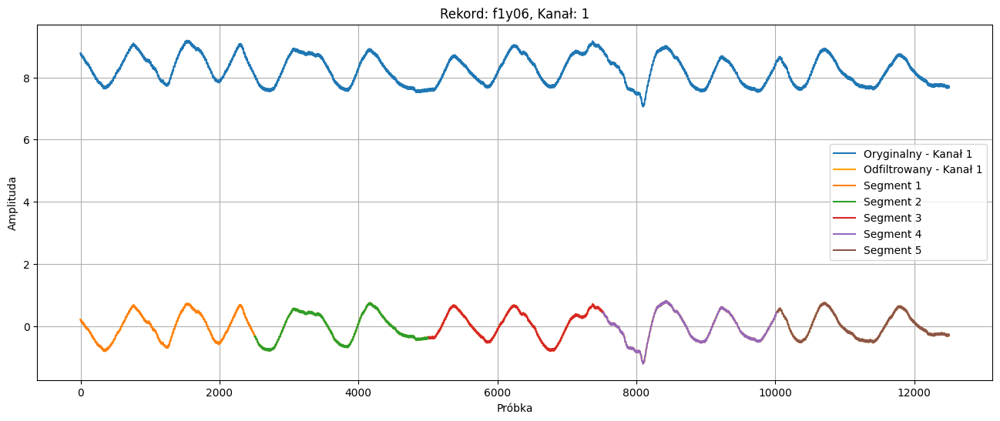

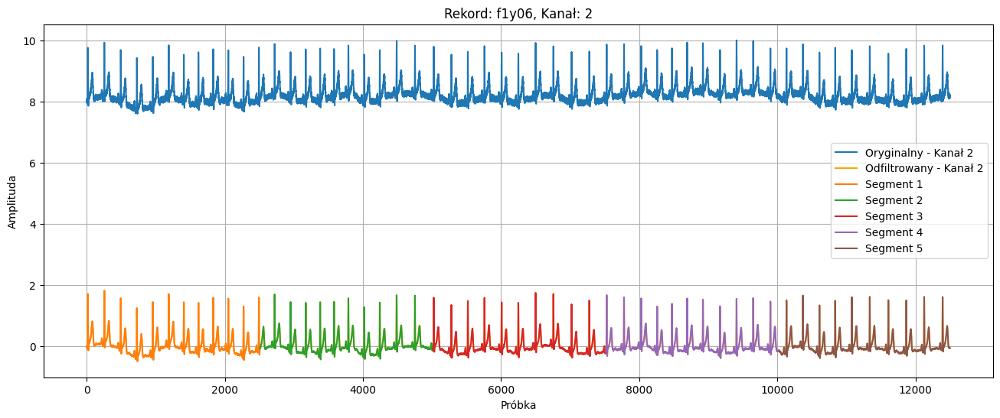

Przetwarzanie rekordu: f1y07 z 2 kanałami


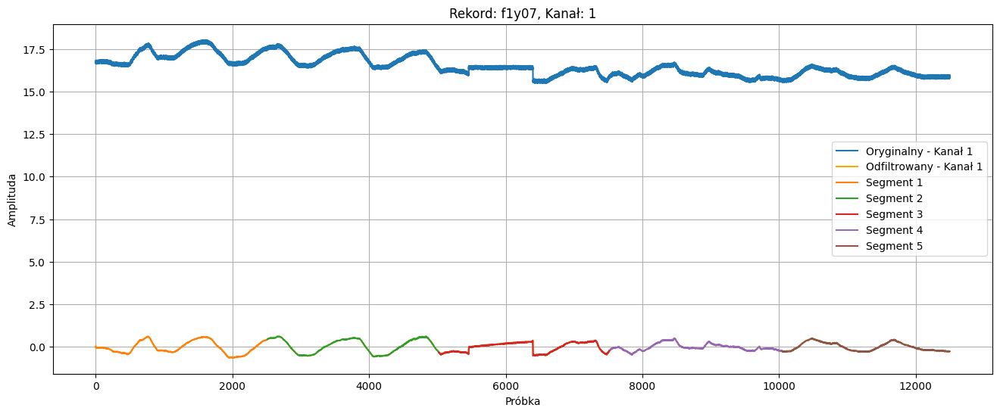

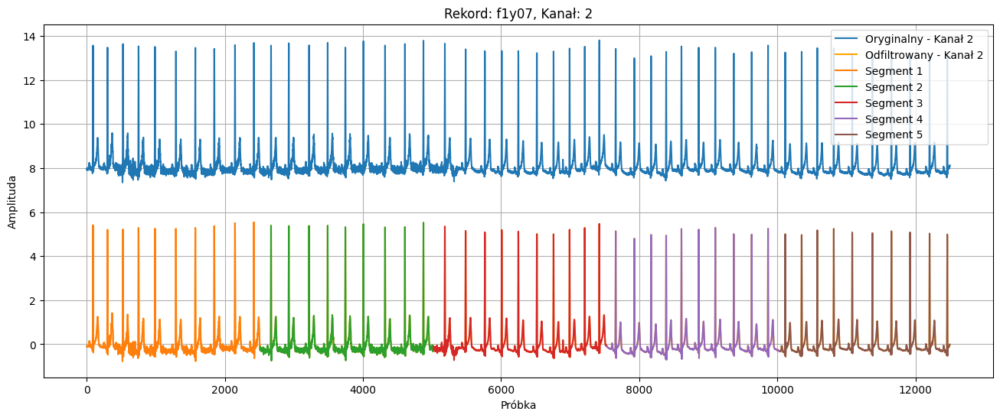

Przetwarzanie rekordu: f1y08 z 2 kanałami


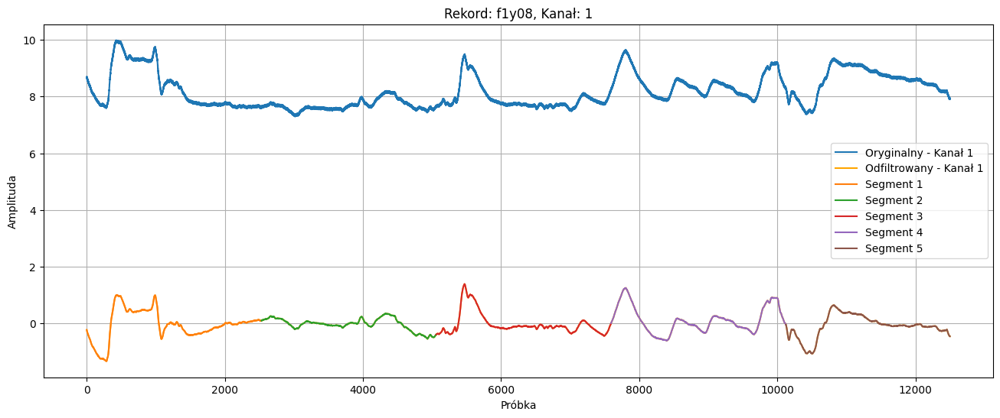

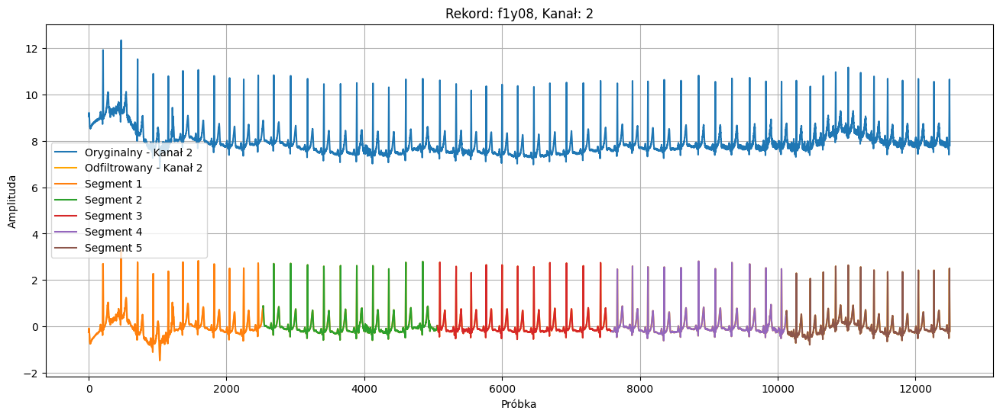

Przetwarzanie rekordu: f1y09 z 2 kanałami


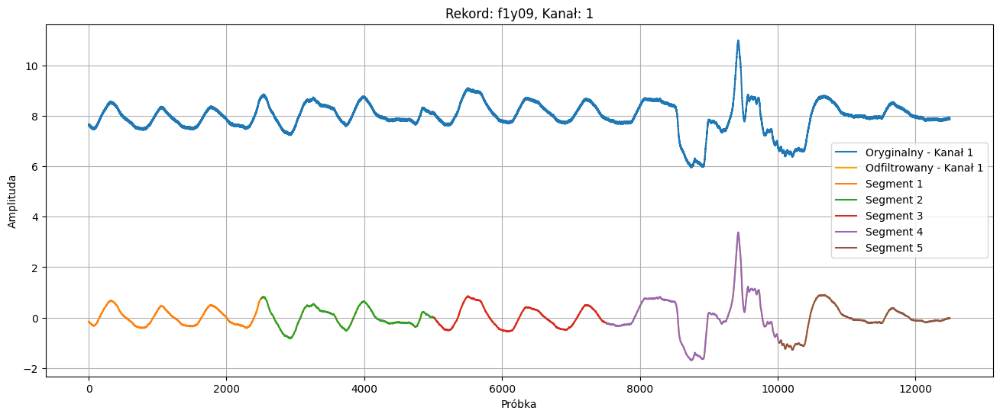

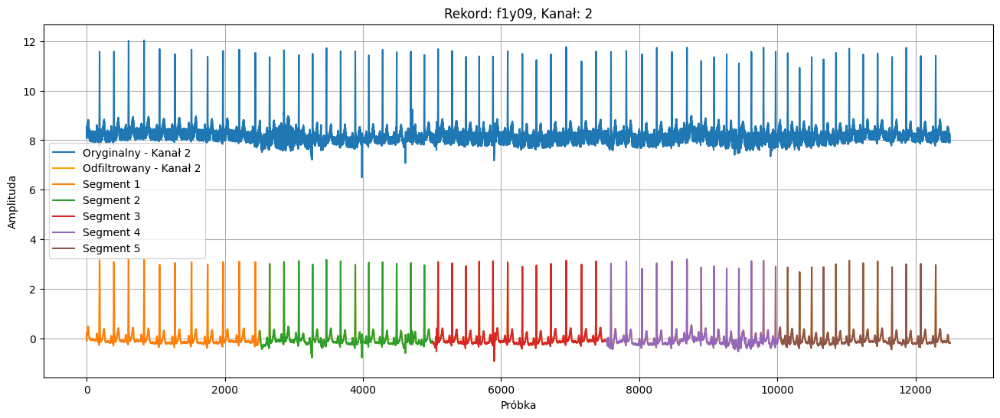

Przetwarzanie rekordu: f1y10 z 2 kanałami


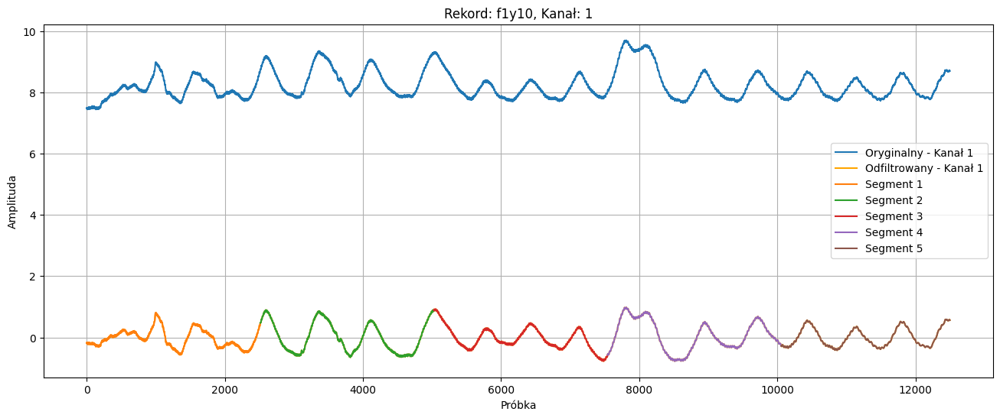

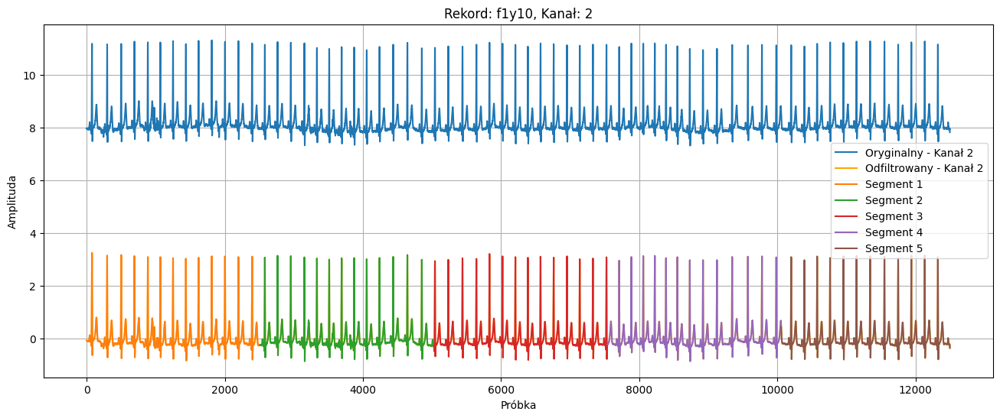

Przetwarzanie rekordu: f2y01 z 3 kanałami


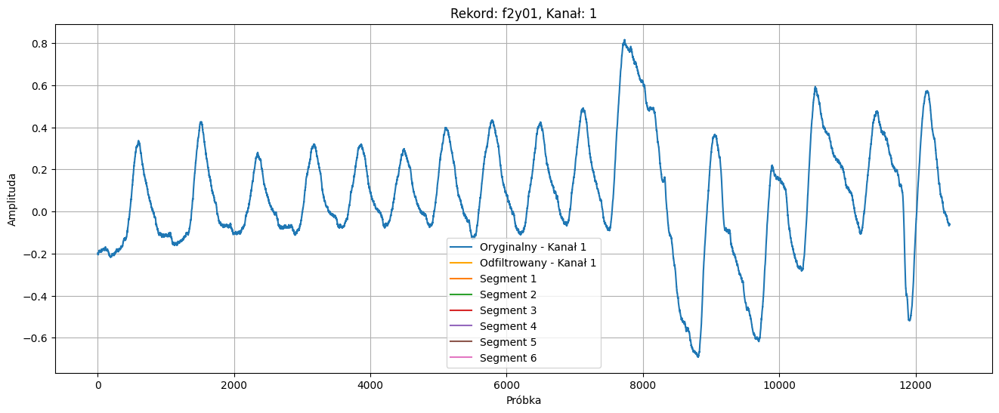

Nie udało się przetworzyć rekordu f2y01. Błąd: Audio buffer is not finite everywhere
Przetwarzanie rekordu: f2y02 z 3 kanałami


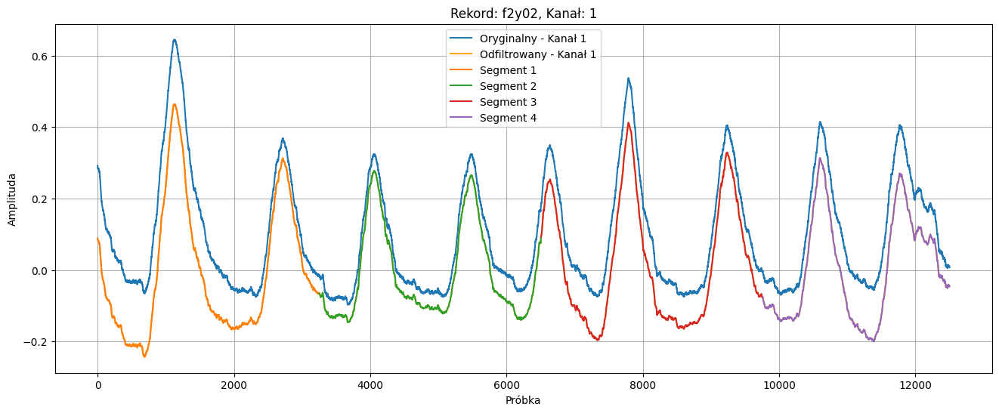

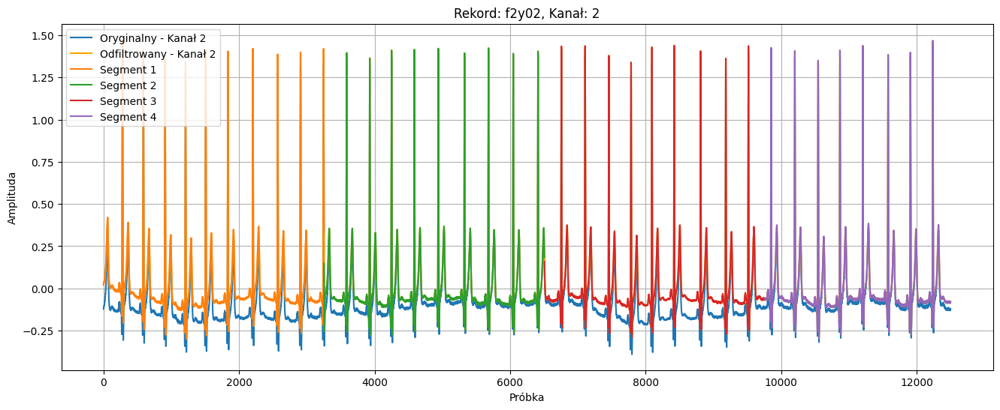

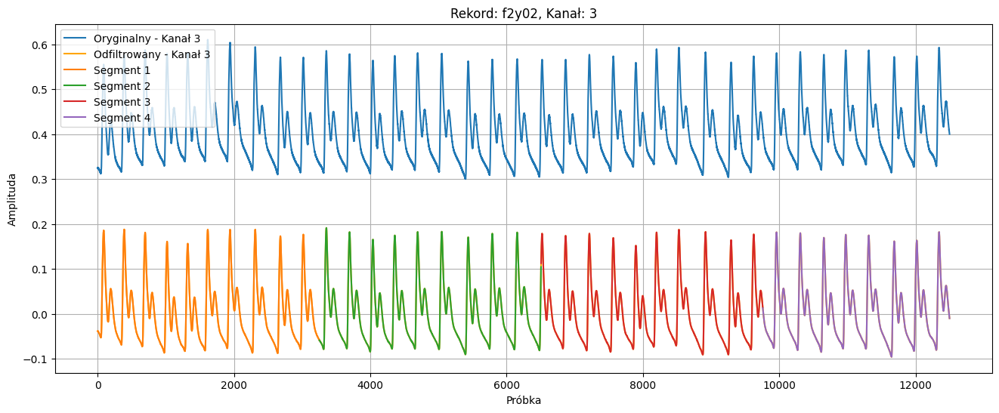

Przetwarzanie rekordu: f2y03 z 3 kanałami


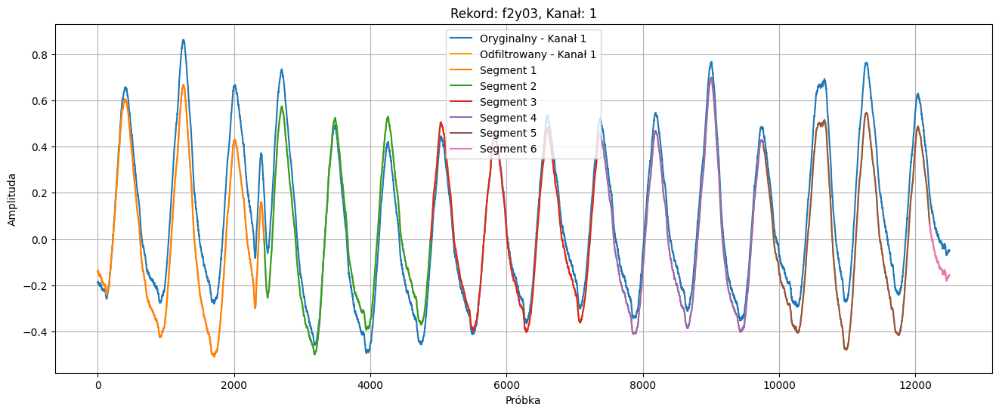

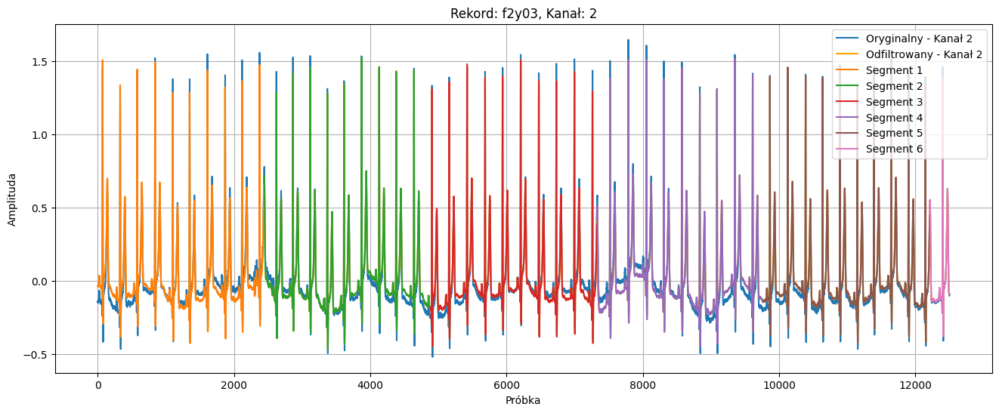

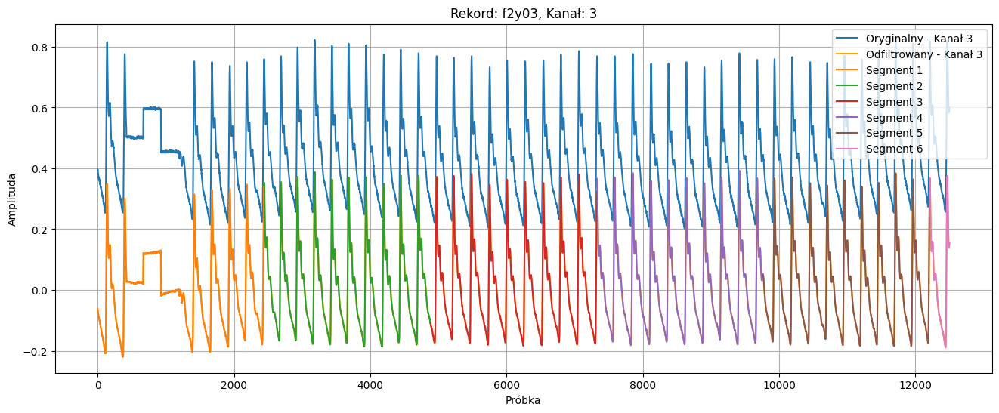

Przetwarzanie rekordu: f2y04 z 3 kanałami


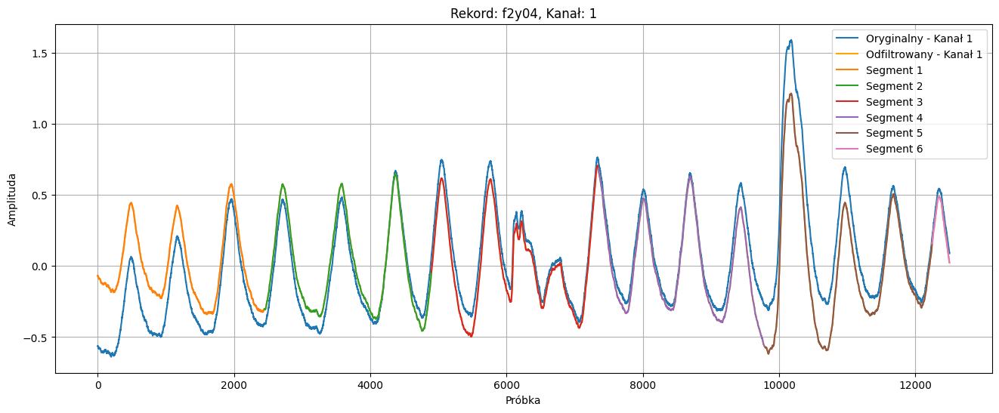

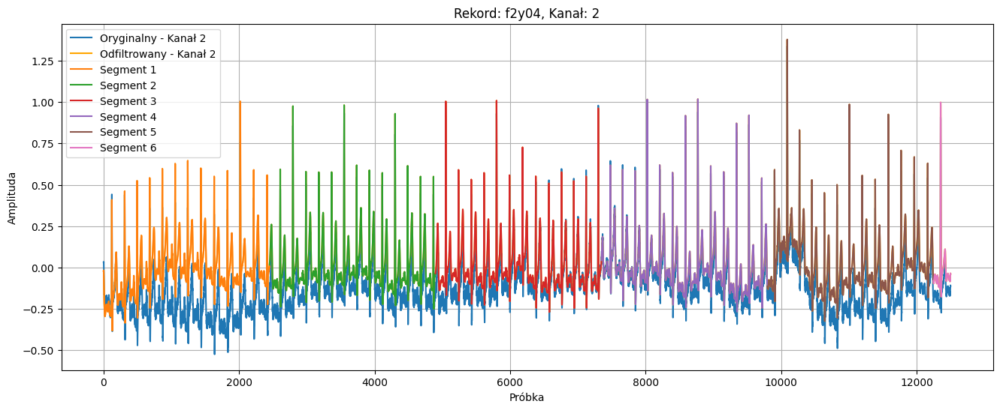

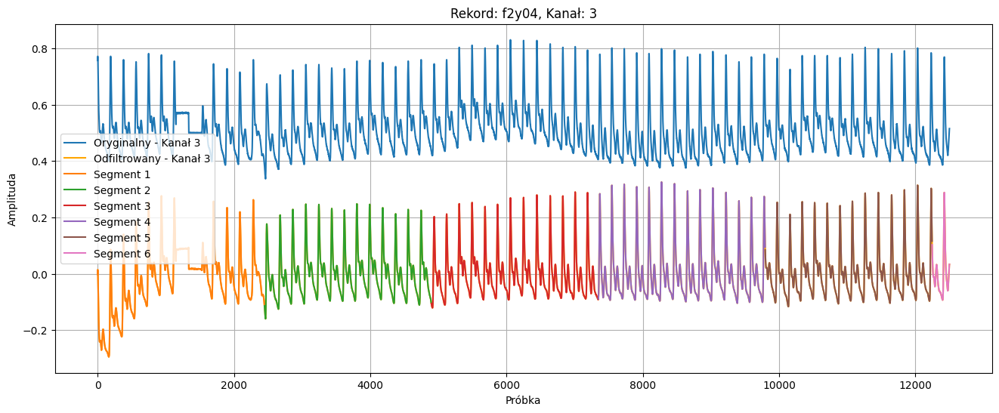

Przetwarzanie rekordu: f2y05 z 3 kanałami


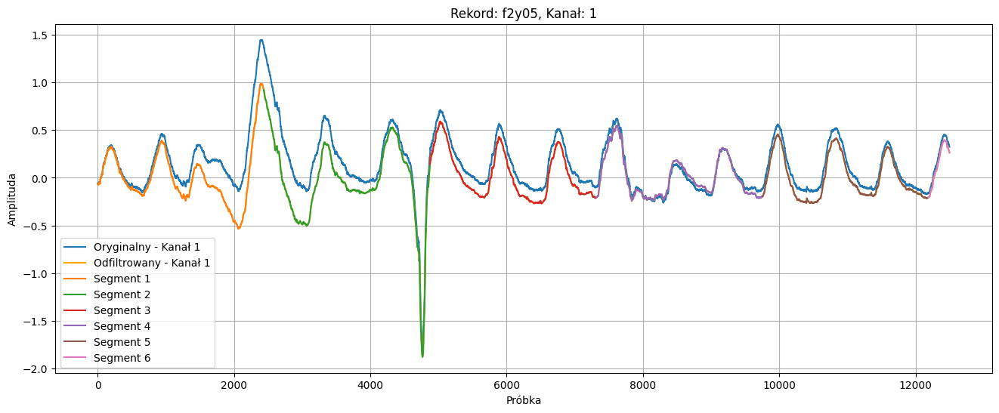

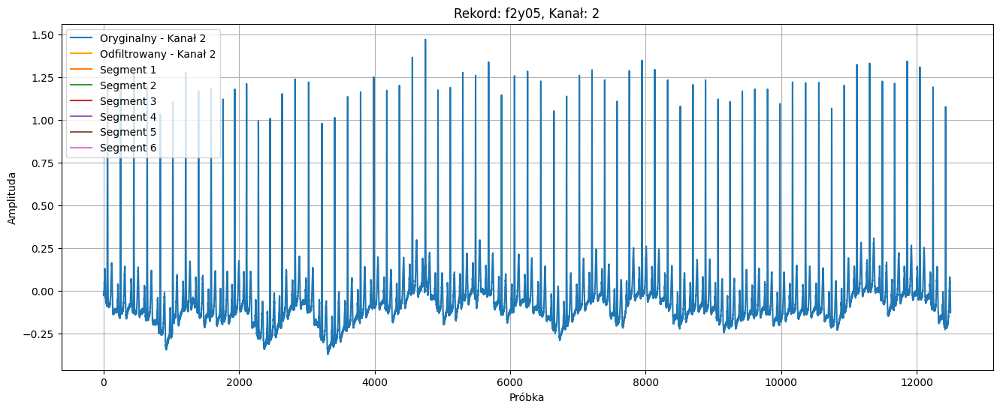

Nie udało się przetworzyć rekordu f2y05. Błąd: Audio buffer is not finite everywhere
Przetwarzanie rekordu: f2y06 z 3 kanałami


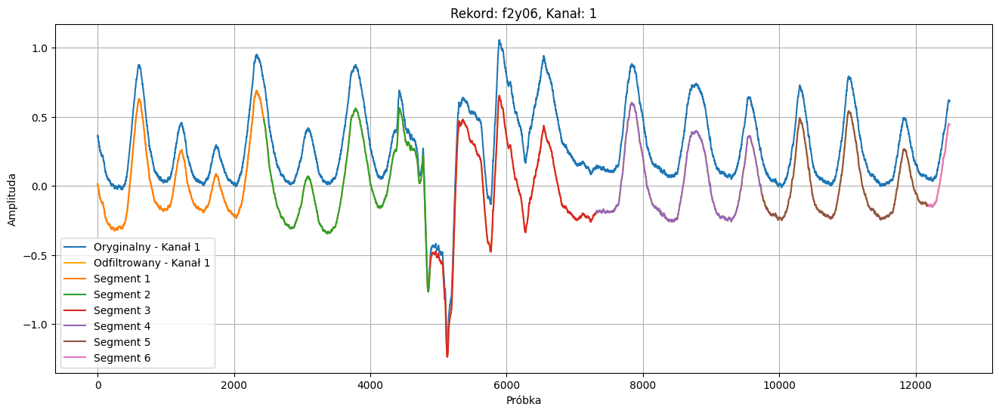

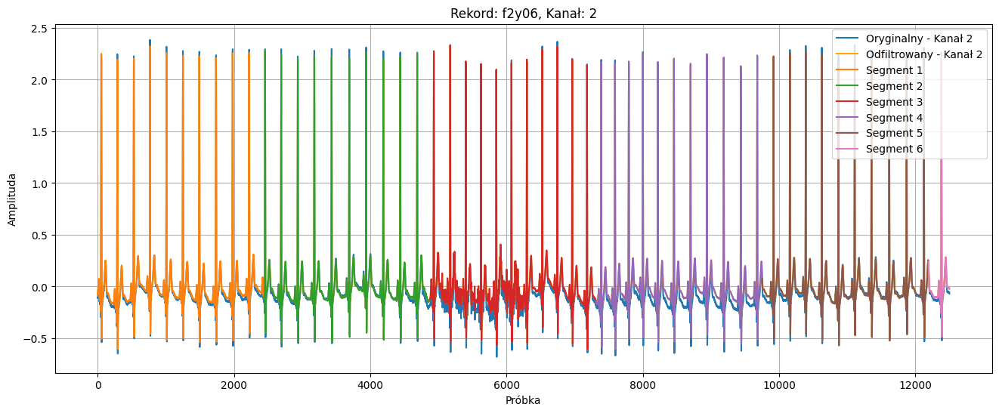

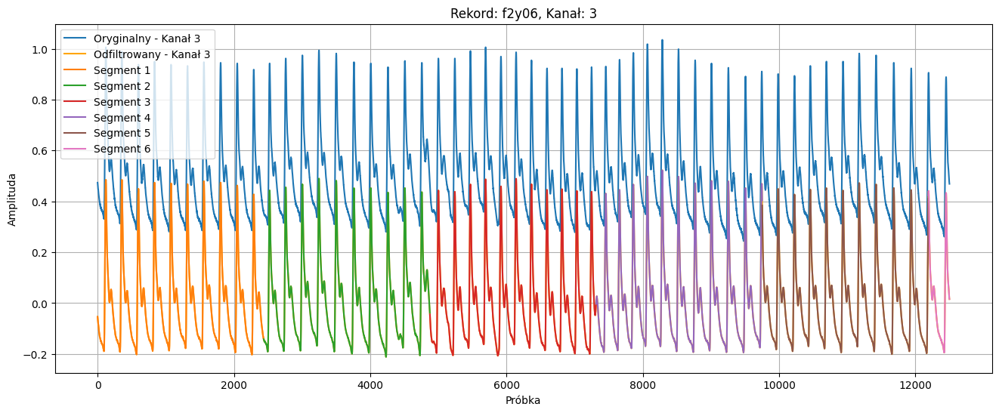

Przetwarzanie rekordu: f2y07 z 3 kanałami


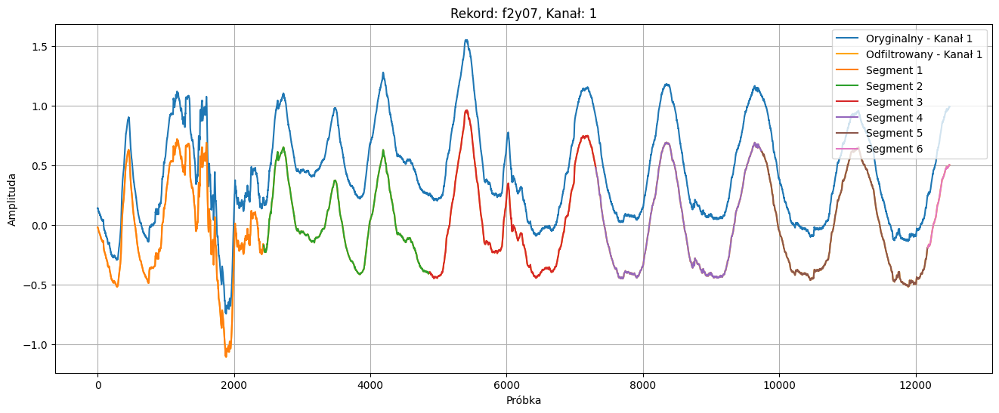

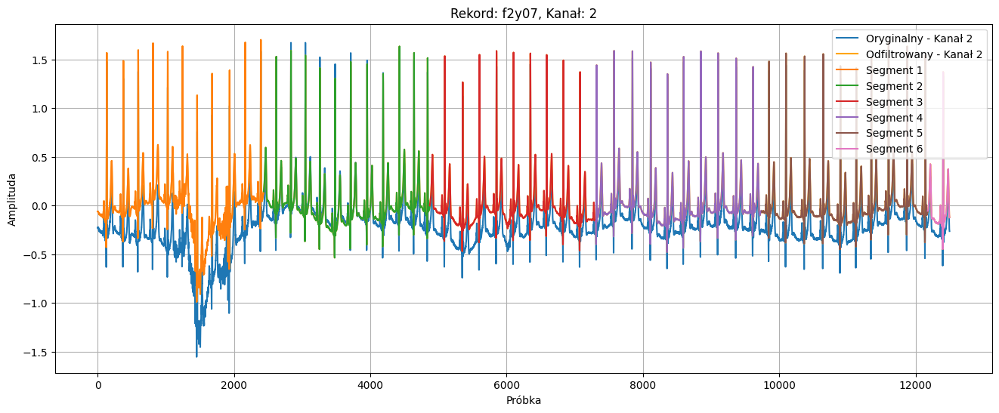

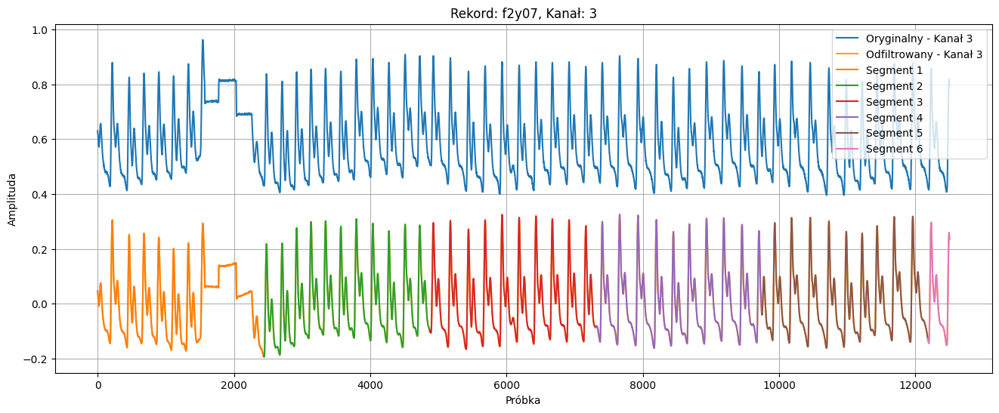

Przetwarzanie rekordu: f2y08 z 3 kanałami


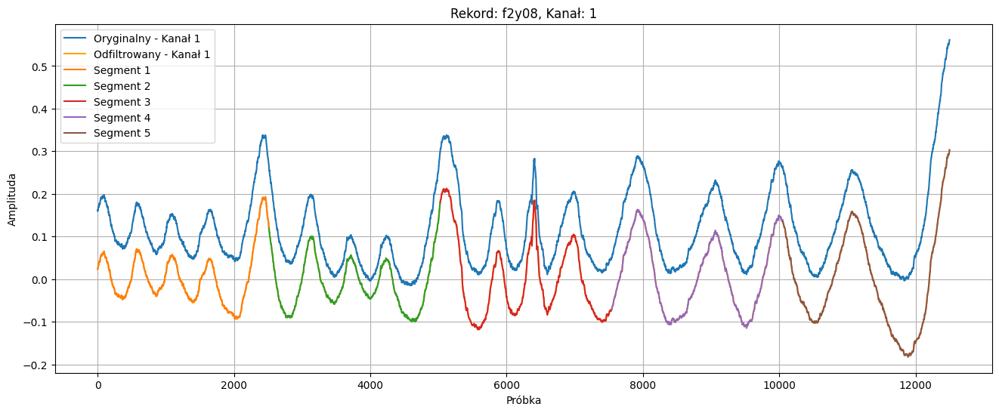

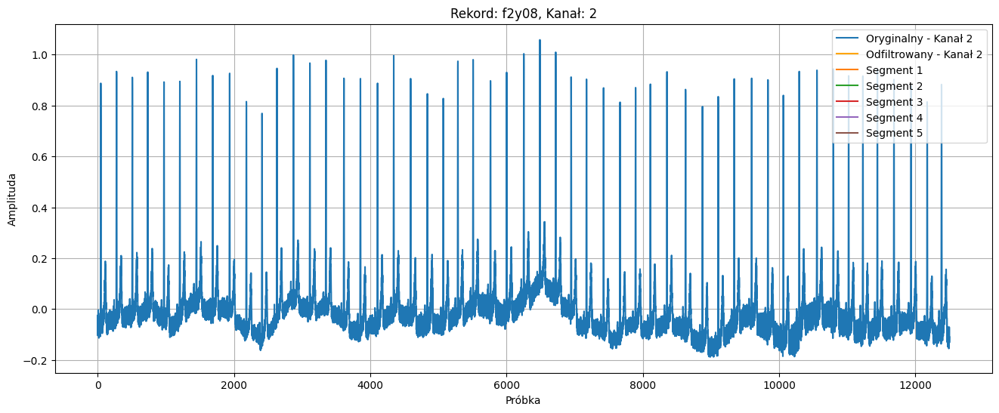

Nie udało się przetworzyć rekordu f2y08. Błąd: Audio buffer is not finite everywhere
Przetwarzanie rekordu: f2y09 z 3 kanałami


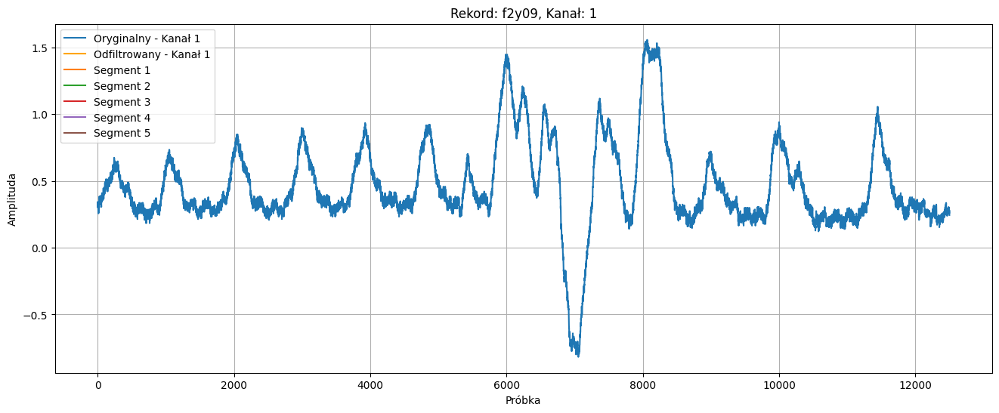

Nie udało się przetworzyć rekordu f2y09. Błąd: Audio buffer is not finite everywhere
Przetwarzanie rekordu: f2y10 z 3 kanałami


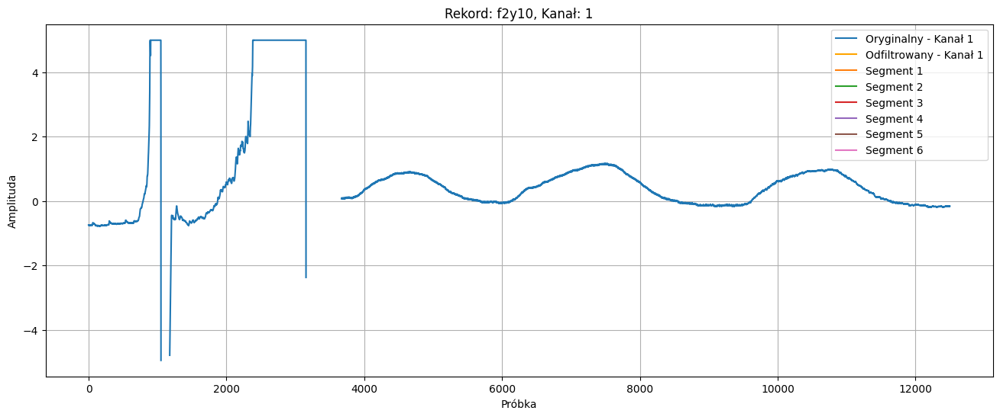

Nie udało się przetworzyć rekordu f2y10. Błąd: Audio buffer is not finite everywhere
Przetwarzanie rekordu: f1o01 z 2 kanałami


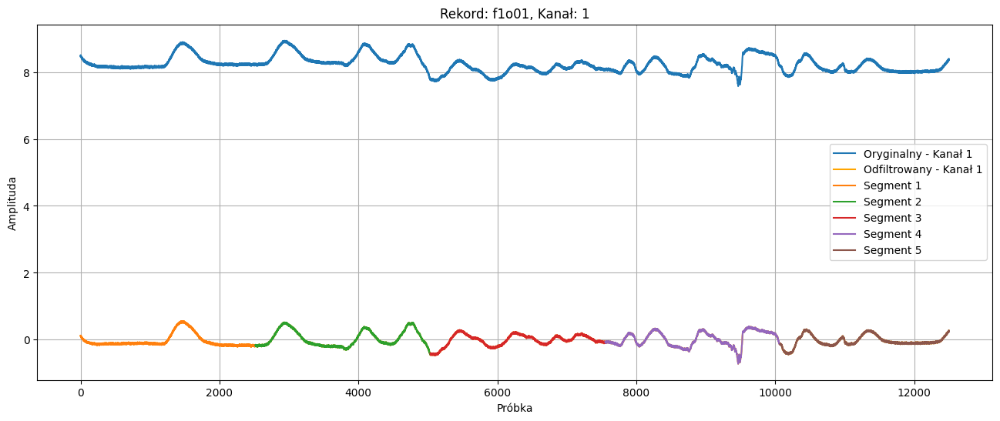

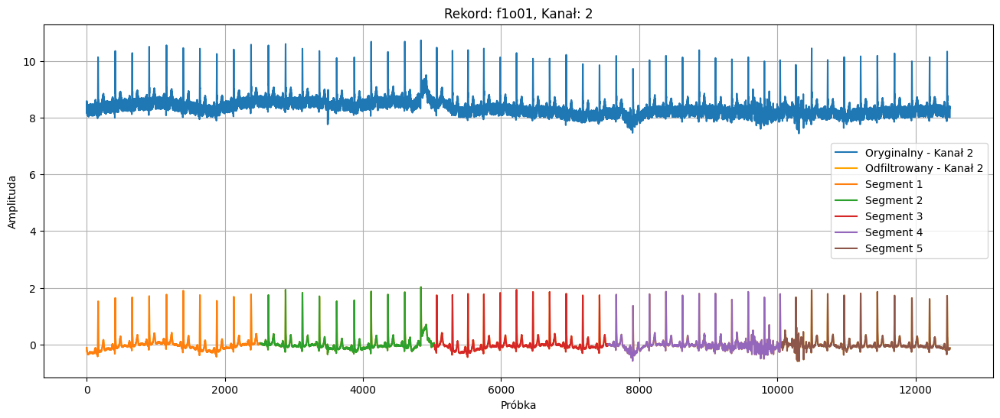

Przetwarzanie rekordu: f1o02 z 2 kanałami


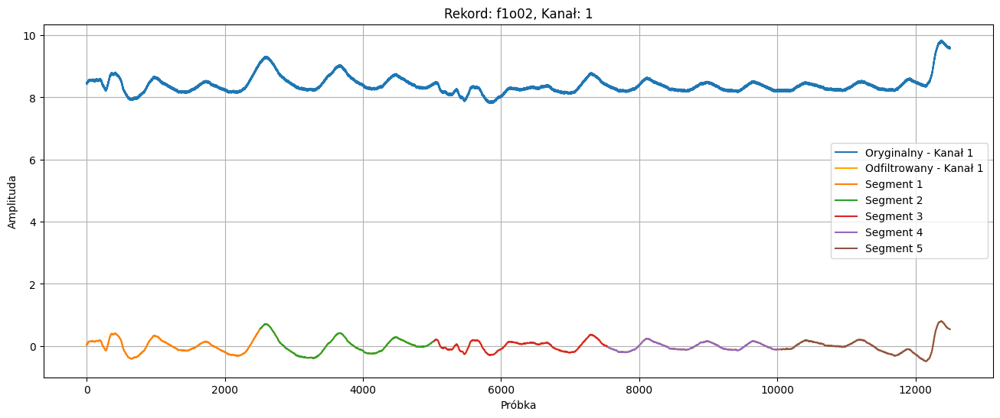

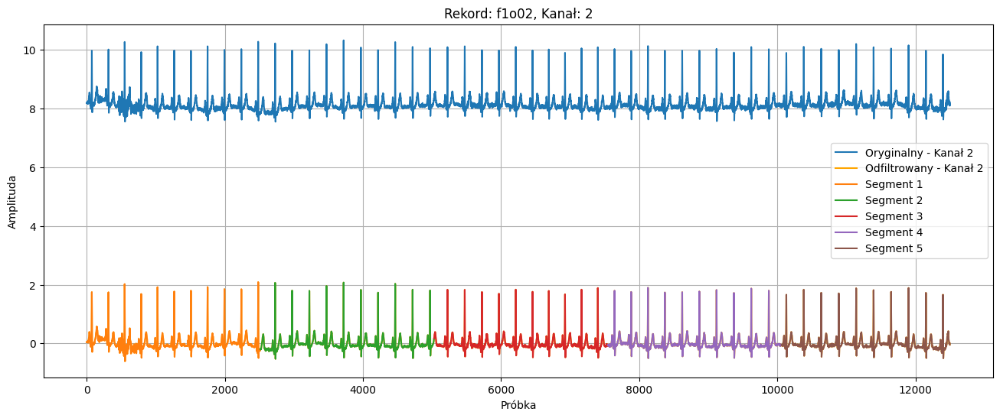

Przetwarzanie rekordu: f1o03 z 2 kanałami


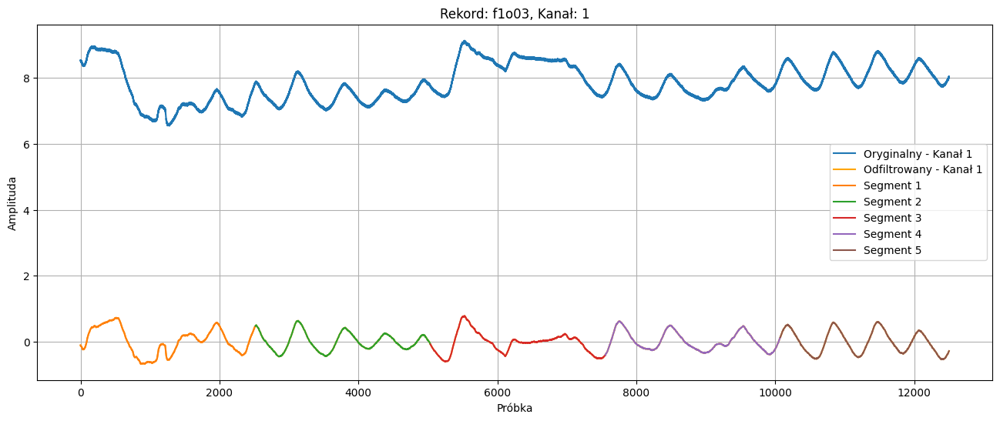

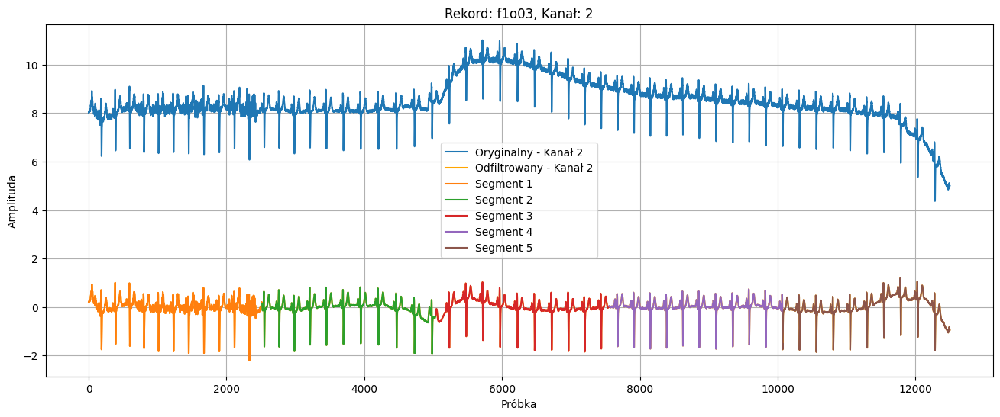

Przetwarzanie rekordu: f1o04 z 2 kanałami


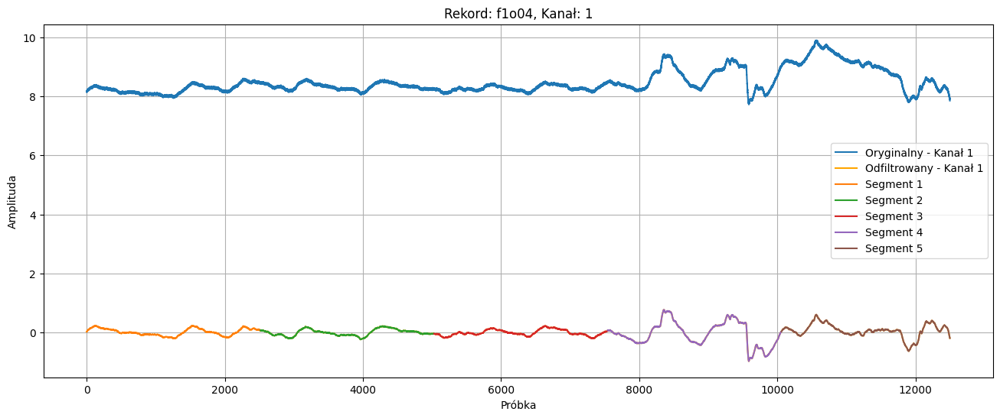

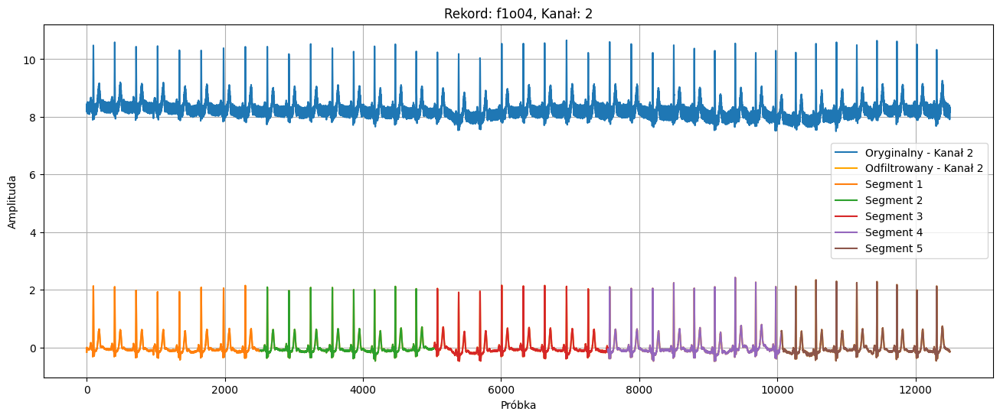

Przetwarzanie rekordu: f1o05 z 2 kanałami


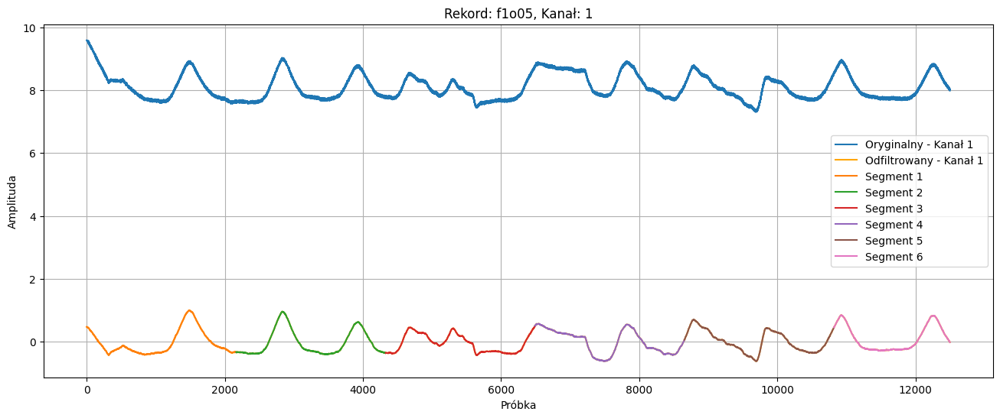

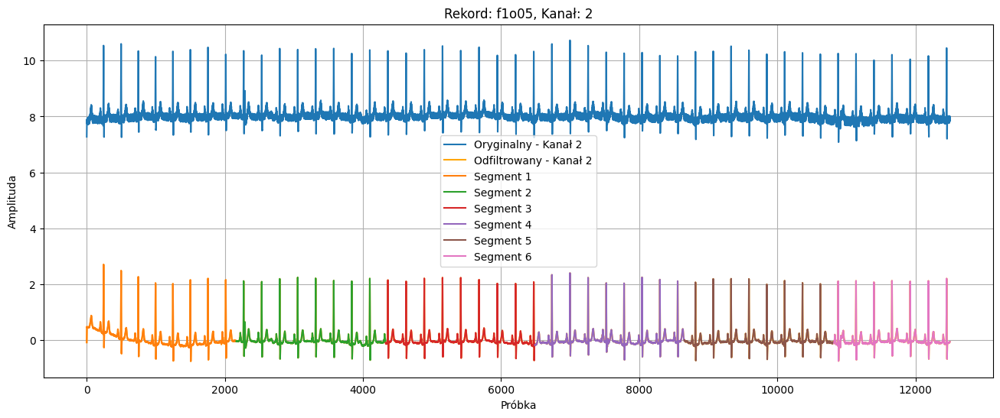

Przetwarzanie rekordu: f1o06 z 2 kanałami


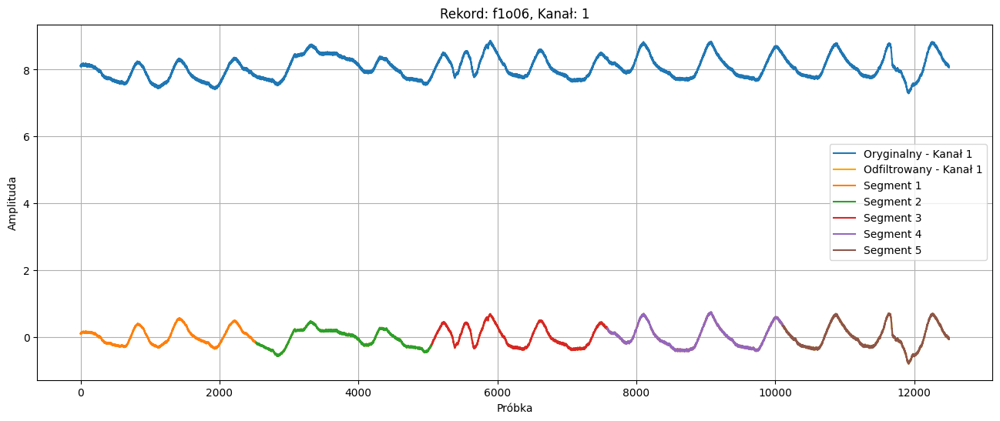

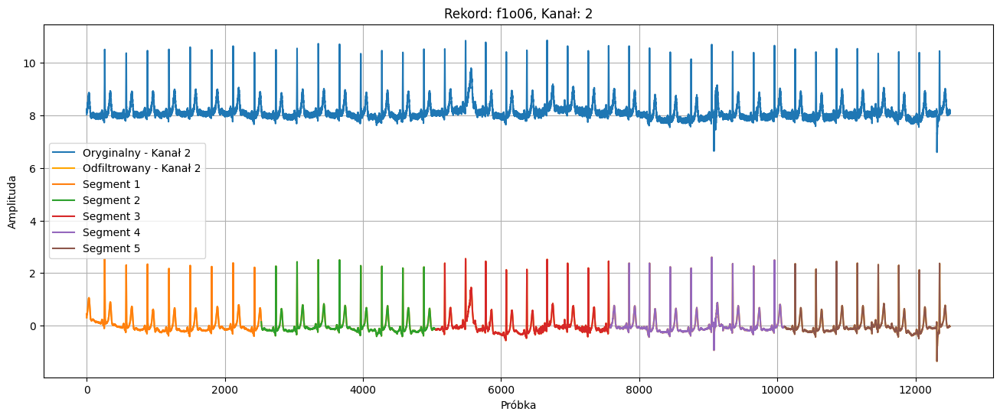

Przetwarzanie rekordu: f1o07 z 2 kanałami


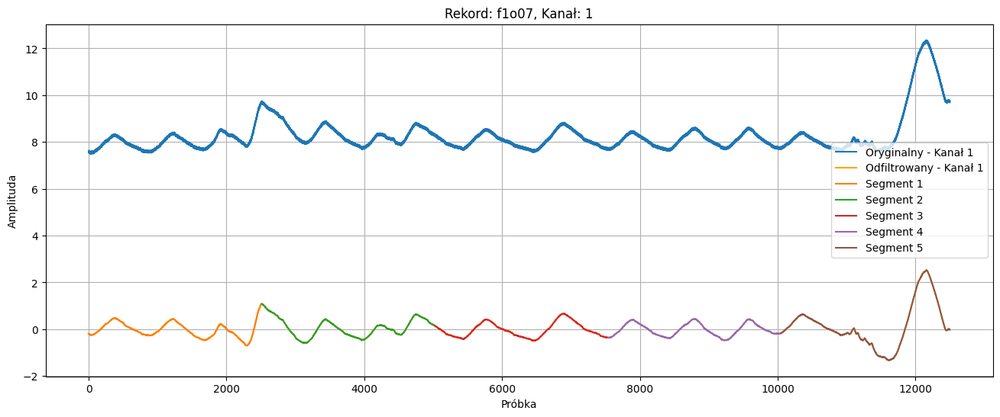

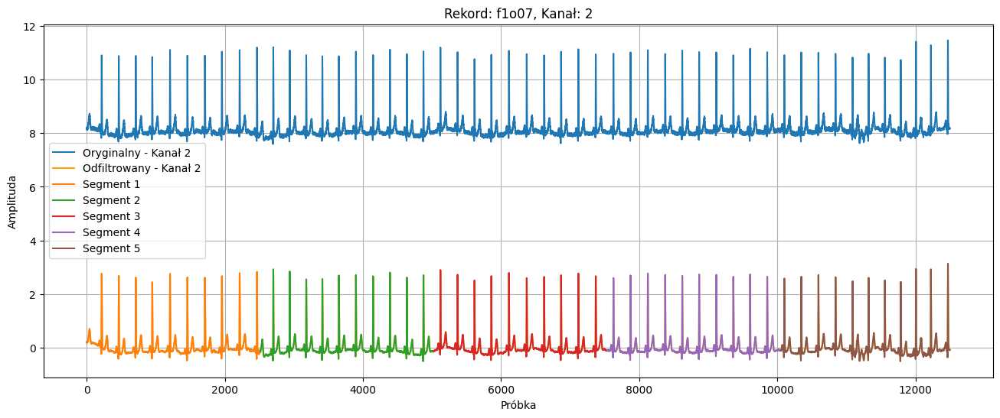

Przetwarzanie rekordu: f1o08 z 2 kanałami


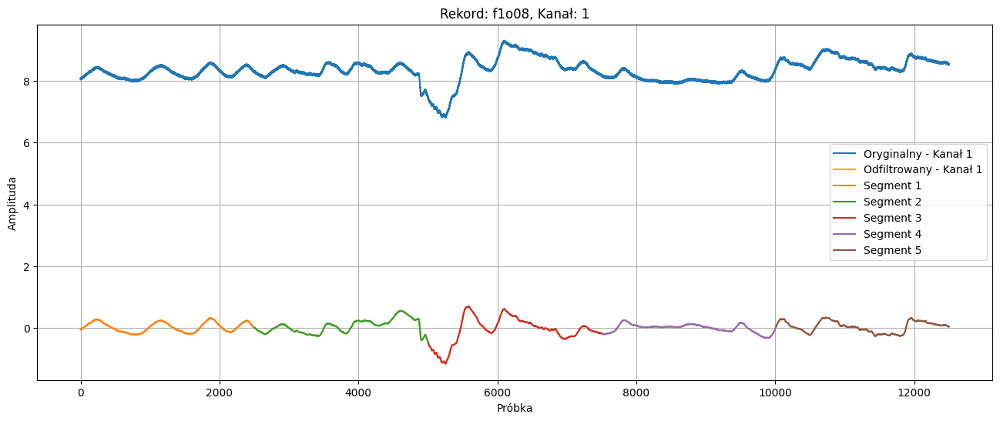

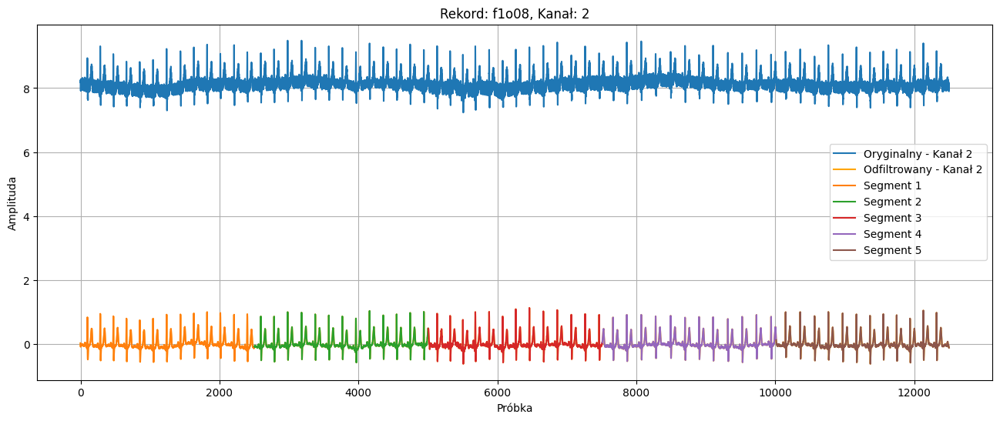

Przetwarzanie rekordu: f1o09 z 2 kanałami


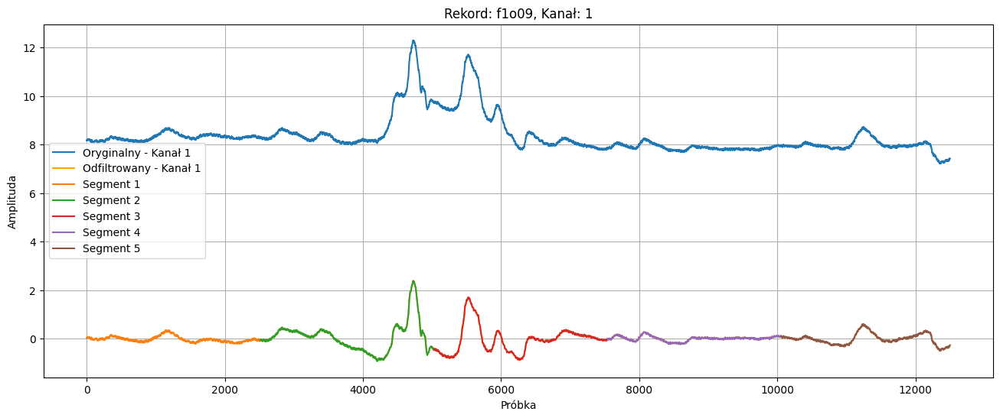

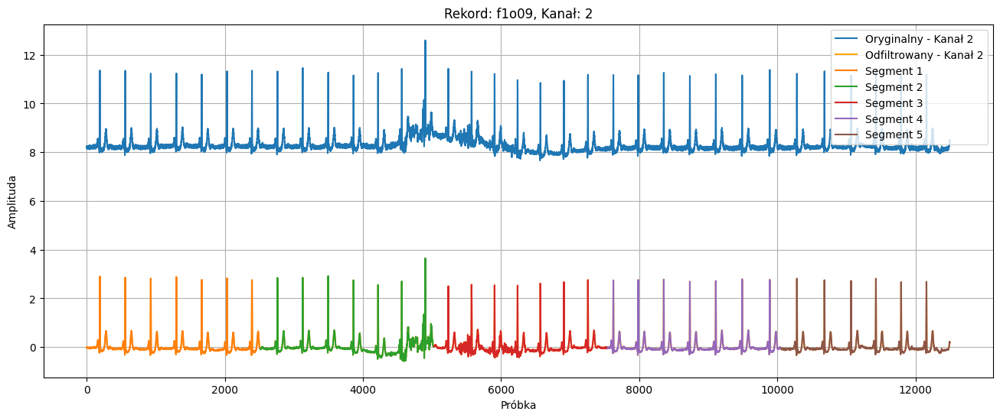

Przetwarzanie rekordu: f1o10 z 2 kanałami


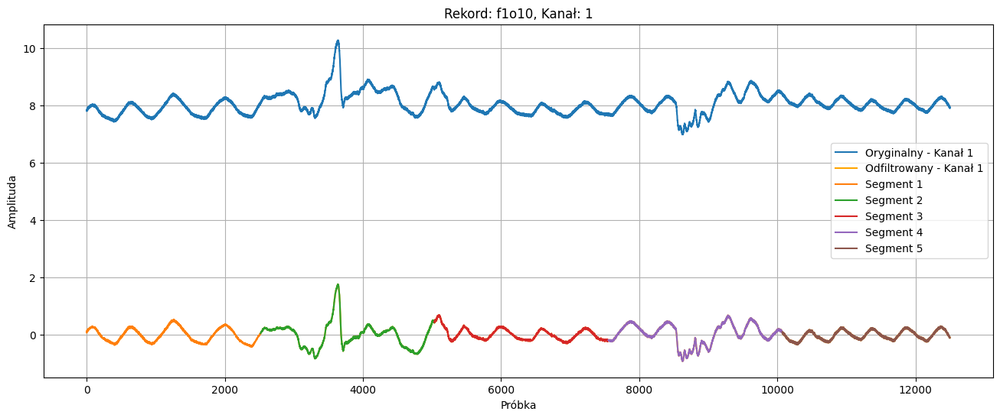

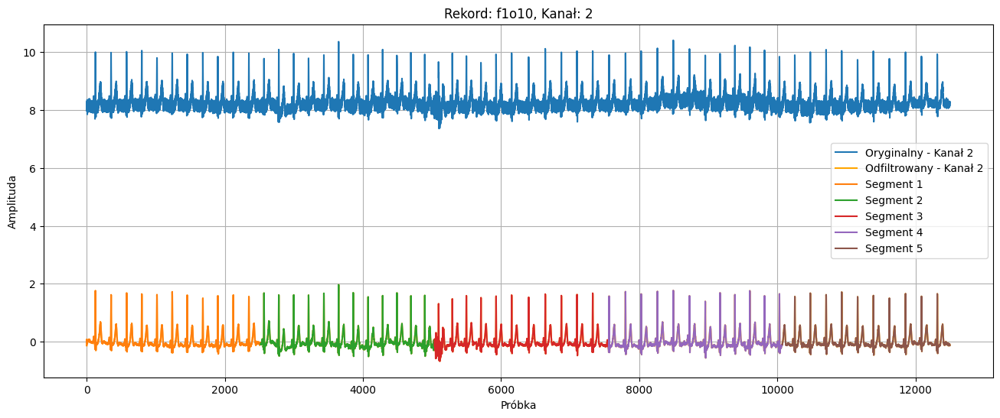

Przetwarzanie rekordu: f2o01 z 3 kanałami


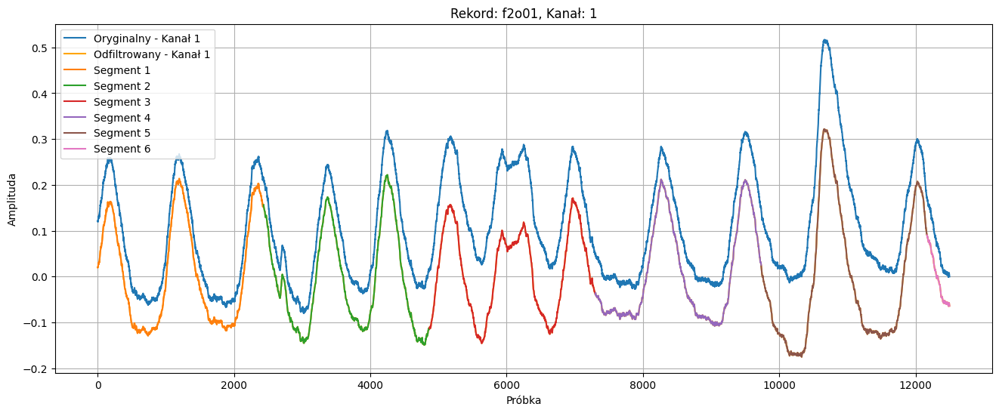

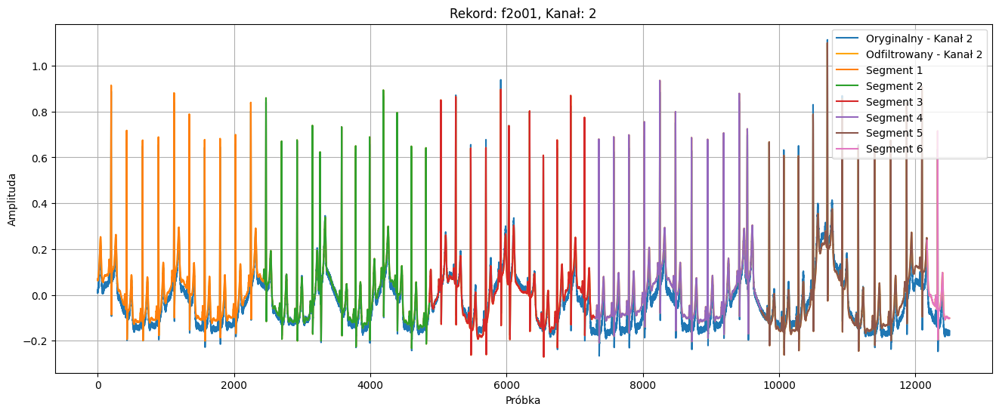

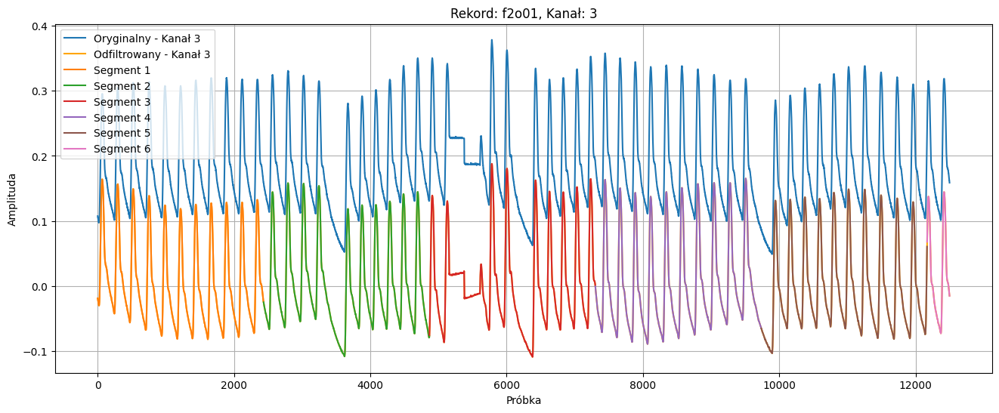

Przetwarzanie rekordu: f2o02 z 3 kanałami


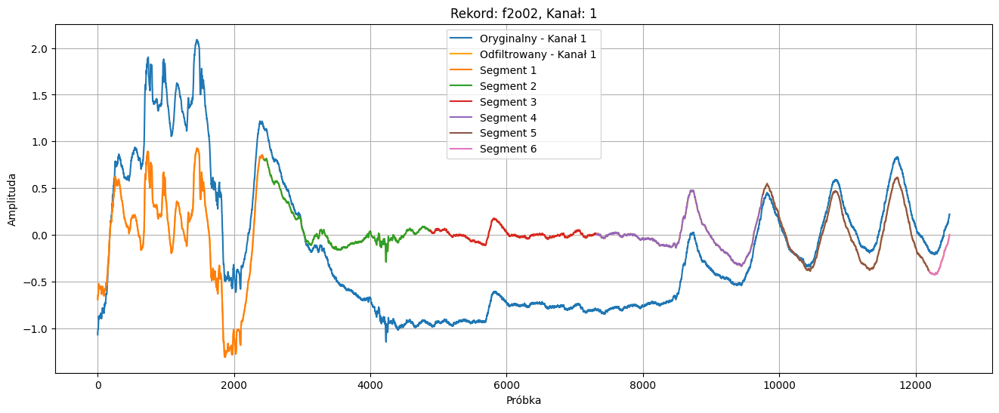

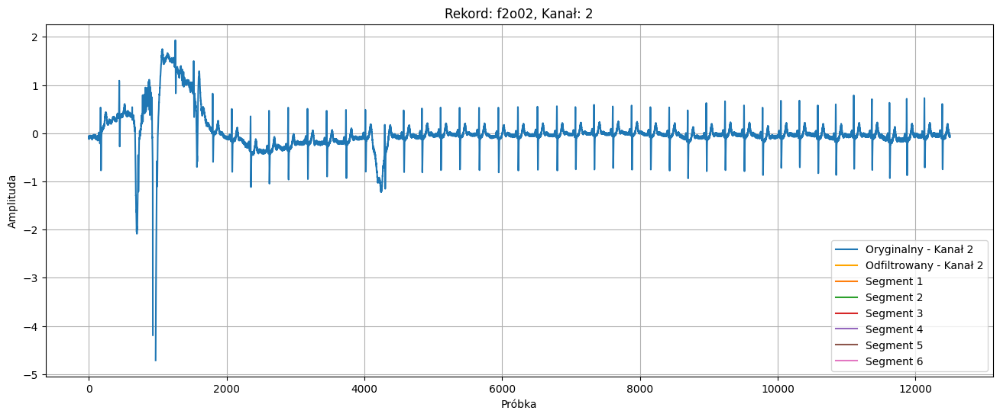

Nie udało się przetworzyć rekordu f2o02. Błąd: Audio buffer is not finite everywhere
Przetwarzanie rekordu: f2o03 z 3 kanałami


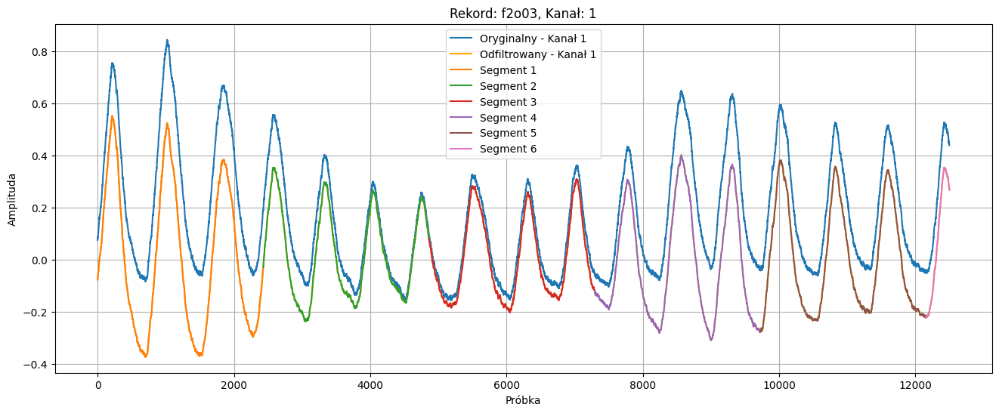

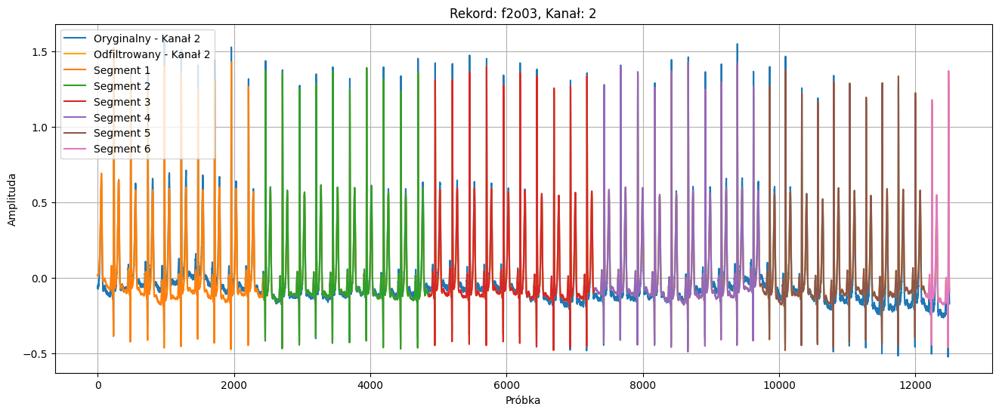

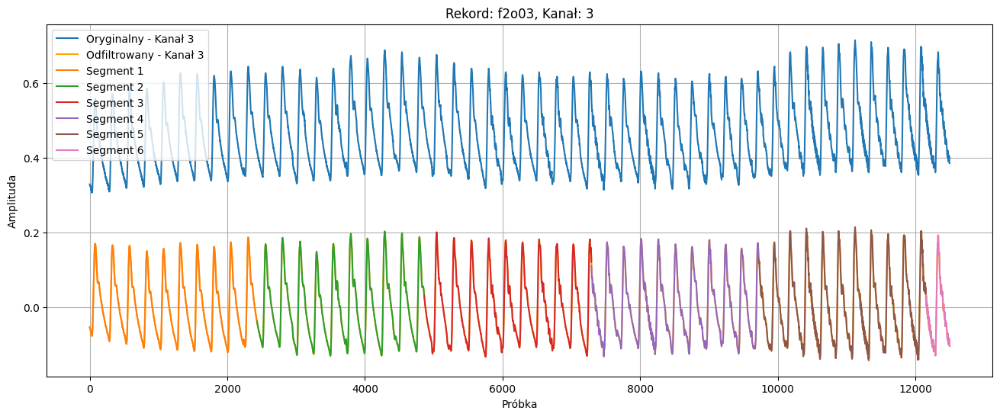

Przetwarzanie rekordu: f2o04 z 3 kanałami


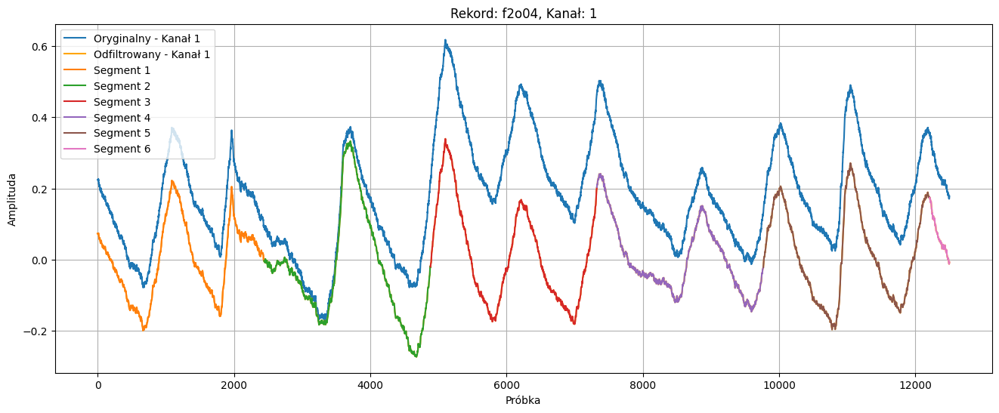

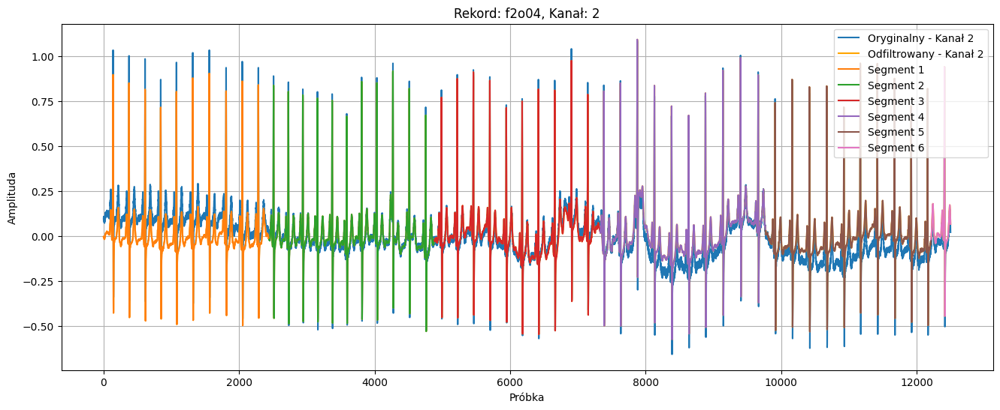

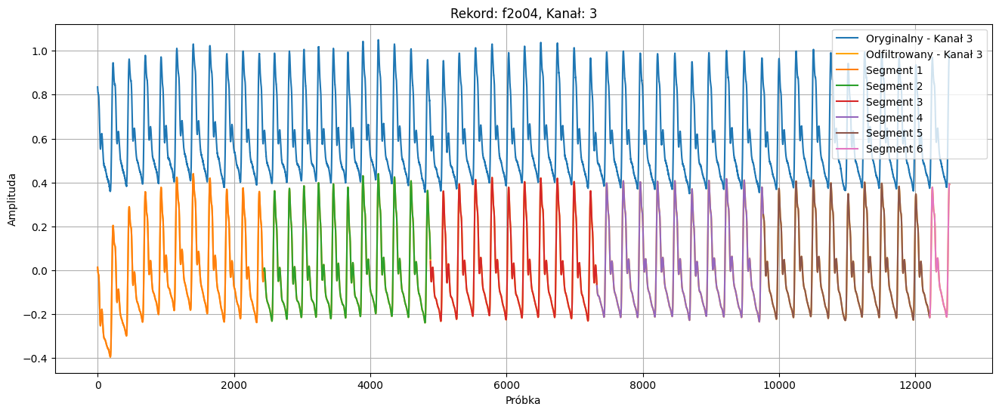

Przetwarzanie rekordu: f2o05 z 3 kanałami


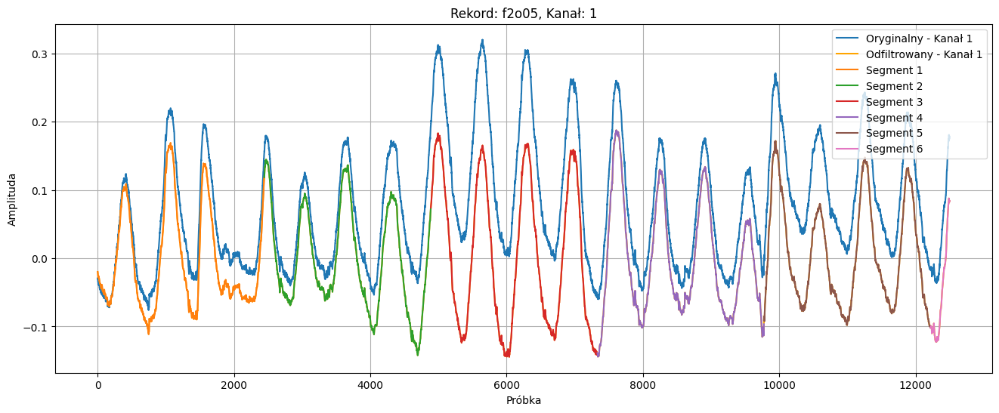

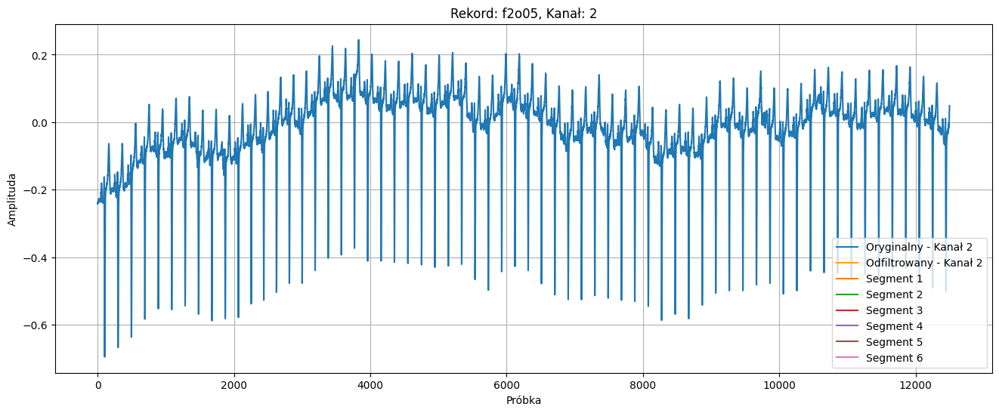

Nie udało się przetworzyć rekordu f2o05. Błąd: Audio buffer is not finite everywhere
Przetwarzanie rekordu: f2o06 z 3 kanałami


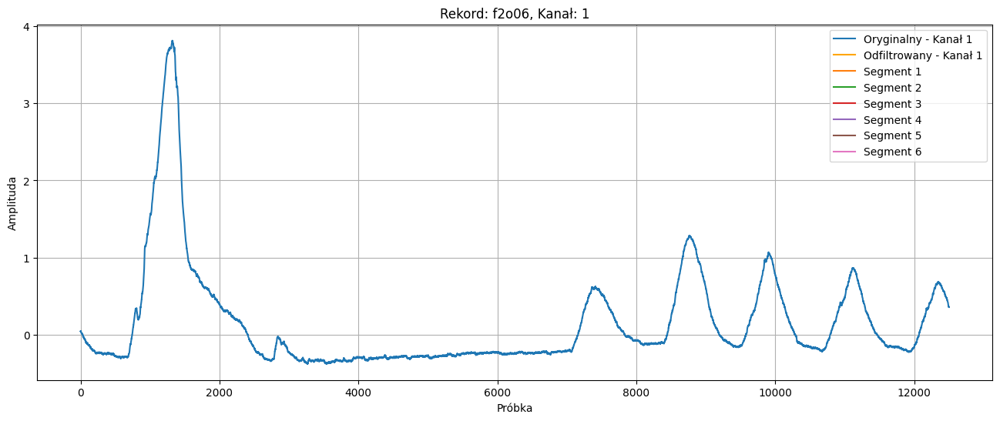

Nie udało się przetworzyć rekordu f2o06. Błąd: Audio buffer is not finite everywhere
Przetwarzanie rekordu: f2o07 z 3 kanałami


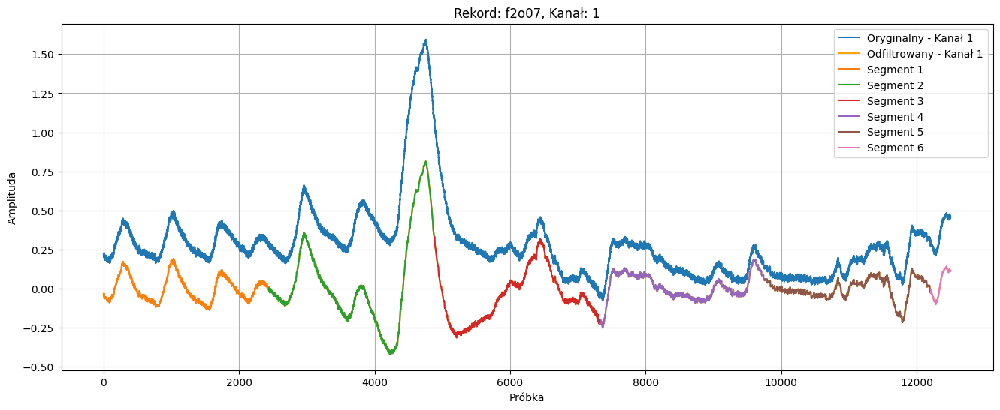

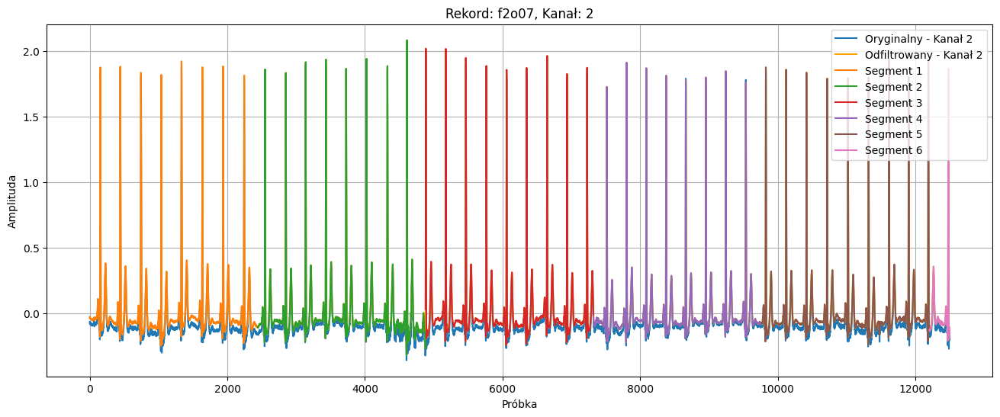

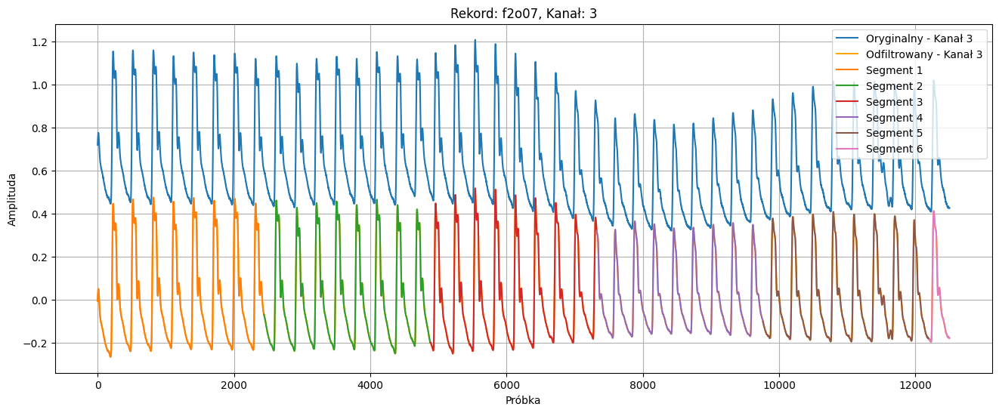

Przetwarzanie rekordu: f2o08 z 3 kanałami


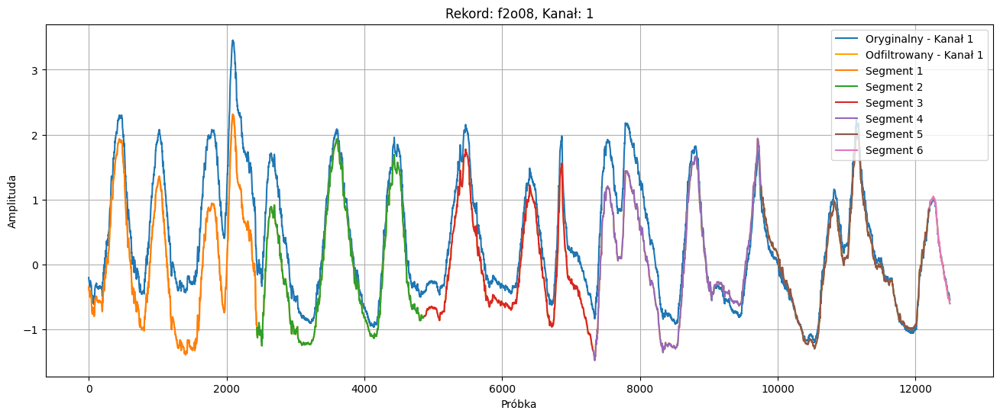

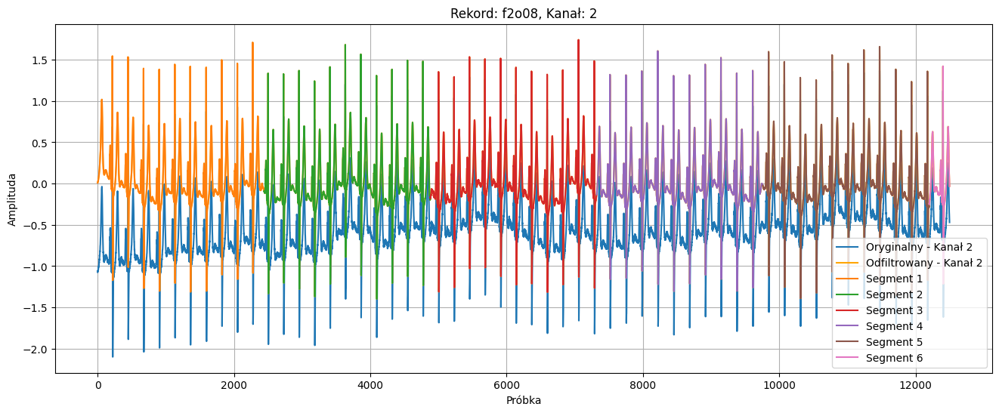

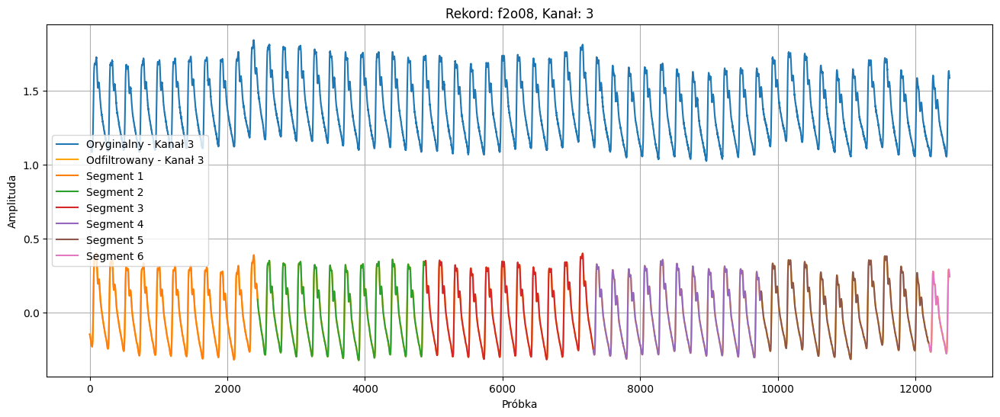

Przetwarzanie rekordu: f2o09 z 3 kanałami


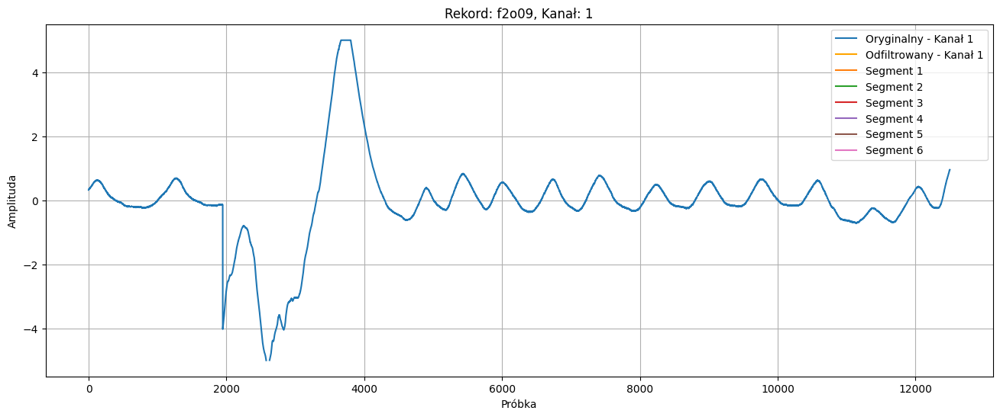

Nie udało się przetworzyć rekordu f2o09. Błąd: Audio buffer is not finite everywhere
Przetwarzanie rekordu: f2o10 z 3 kanałami


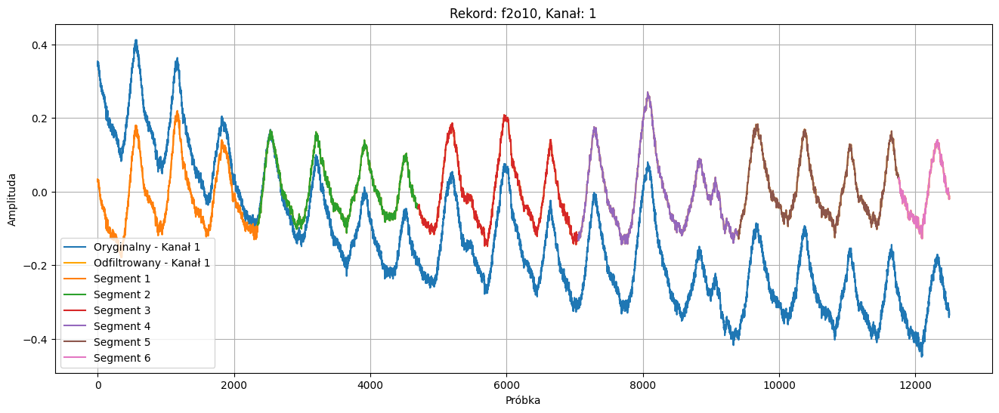

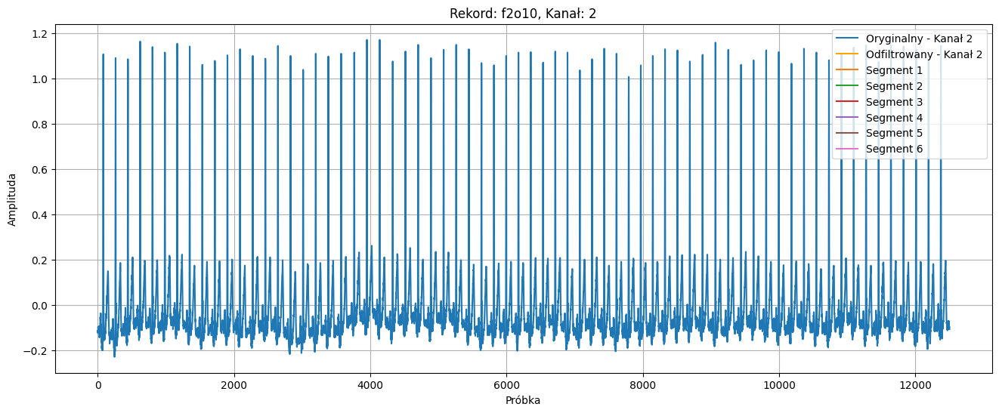

Nie udało się przetworzyć rekordu f2o10. Błąd: Audio buffer is not finite everywhere


In [19]:
def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = filtfilt(b, a, data)
    return y

def get_patient_metadata(record_name):
    header = wfdb.rdheader(record_name, pn_dir='fantasia')
    age, sex = None, None

    for comment in header.comments:
        if 'Age:' in comment:
            age = int(comment.split('Age:')[-1].strip().split()[0])
        if 'Sex:' in comment:
            sex = comment.split('Sex:')[-1].strip().split()[0]

    age_group = "young" if age and age < 35 else "old" if age else "unknown"

    return {
        "age": age,
        "age_group": age_group,
        "sex": sex if sex else "unknown",
        "sampling_rate": header.fs,
        "signal_names": header.sig_name
    }

def extract_features(signal, rate):
    features = {}

    features['zcr'] = np.mean(zero_crossing_rate(signal))     # ZCR - Zero Crossing Rate

    features['rolloff'] = np.mean(librosa.feature.spectral_rolloff(y=signal, sr=rate, n_fft=256)) # Spectral roll-off

    features['spec_cent'] = np.mean(spectral_centroid(y=signal, sr=rate, n_fft=256)) # Spectral centroid

    features['spec_bw'] = np.mean(spectral_bandwidth(y=signal, sr=rate, n_fft=256))  # Spectral bandwidth

    features['chroma_stft'] = np.mean(chroma_stft(y=signal, sr=rate, n_fft=256)) # Chroma STFT

    features['rmse'] = np.mean(np.sqrt(np.mean(signal**2))) # RMSE

    mfccs = mfcc(y=signal, sr=rate, n_mfcc=13, fmin=20, fmax=125) # MFCC - Mel Frequency Cepstral Coefficients
    features['mfcc_mean'] = np.mean(mfccs, axis=1)

    coeffs = pywt.wavedec(signal, 'db4', level=4) # PyWavelet - Wavelet Transform features
    features['wavelet_coeffs'] = [np.mean(c) for c in coeffs]

    features['wavelet_energy'] = sum(np.sum(c**2) for c in coeffs)

    return features

record_names = [
    f'f1y{str(i).zfill(2)}' for i in range(1, 11)
] + [
    f'f2y{str(i).zfill(2)}' for i in range(1, 11)
] + [
    f'f1o{str(i).zfill(2)}' for i in range(1, 11)
] + [
    f'f2o{str(i).zfill(2)}' for i in range(1, 11)
]

lowcut = 0.1
highcut = 50
fs = 250

columns = ['Record', 'Channel', 'Segment Index', 'Mean', 'Std Dev', 'Age Group', 'Sex', 'Sampling Rate', 'Signal Names',
           'ZCR', 'Spectral Rolloff', 'Spectral Centroid', 'Spectral Bandwidth', 'Chroma STFT', 'RMSE',
           'MFCC Mean', 'Wavelet Coeffs', 'Wavelet Energy']
df = pd.DataFrame(columns=columns)

for record_name in record_names:
    try:
        metadata = get_patient_metadata(record_name)

        record = wfdb.rdrecord(record_name, pn_dir='fantasia')
        n_channels = record.p_signal.shape[1]
        print(f"Przetwarzanie rekordu: {record_name} z {n_channels} kanałami")

        for channel_idx in range(n_channels):
            original_signal = record.p_signal[:, channel_idx]
            bandpassed_signal = butter_bandpass_filter(original_signal, lowcut, highcut, fs)

            num_segments = 720
            window_size = len(bandpassed_signal) // num_segments

            segments = []
            for i in range(num_segments):
                start = i * window_size
                end = (i + 1) * window_size if (i + 1) * window_size < len(bandpassed_signal) else len(bandpassed_signal)
                segment = bandpassed_signal[start:end]
                segments.append(segment)

            plt.figure(figsize=(16, 6))

            plt.plot(original_signal[:12500], label=f"Oryginalny - Kanał {channel_idx + 1}")
            plt.plot(bandpassed_signal[:12500], label=f"Odfiltrowany - Kanał {channel_idx + 1}", color='orange')

            x_offset = 0
            for i, segment in enumerate(segments):
                start = i * window_size
                if start < 12500:
                    segment_end = min(start + len(segment), 12500)
                    plt.plot(np.arange(start, segment_end), segment[:segment_end-start], label=f'Segment {i+1}')

            plt.legend()
            plt.xlabel("Próbka")
            plt.ylabel("Amplituda")
            plt.title(f"Rekord: {record_name}, Kanał: {channel_idx + 1}")
            plt.grid()
            plt.show()

            for i, segment in enumerate(segments):
                features = extract_features(segment, fs)

                segment_df = pd.DataFrame({
                    'Record': [record_name],
                    'Channel': [channel_idx + 1],
                    'Segment Index': [i + 1],
                    'Mean': [np.mean(segment)],
                    'Std Dev': [np.std(segment)],
                    #'Age': [metadata["age"]],
                    'Age Group': [metadata["age_group"]],
                    'Sex': [metadata["sex"]],
                    'Sampling Rate': [metadata["sampling_rate"]],
                    'Signal Names': [metadata["signal_names"]],
                    'ZCR': [features['zcr']],
                    'Spectral Rolloff': [features['rolloff']],
                    'Spectral Centroid': [features['spec_cent']],
                    'Spectral Bandwidth': [features['spec_bw']],
                    #'Spectral Contrast': [features['spec_cont']],
                    'Chroma STFT': [features['chroma_stft']],
                    'RMSE': [features['rmse']],
                    'MFCC Mean': [features['mfcc_mean']],
                    'Wavelet Coeffs': [features['wavelet_coeffs']],
                    'Wavelet Energy': [features['wavelet_energy']]
                })

                df = pd.concat([df, segment_df], ignore_index=True)

    except Exception as e:
        print(f"Nie udało się przetworzyć rekordu {record_name}. Błąd: {e}")

In [20]:
df.to_csv('segmentation_results.csv', index=False)

df

,Record,Channel,Segment Index,Mean,Std Dev,Age Group,Sex,Sampling Rate,Signal Names,ZCR,Spectral Rolloff,Spectral Centroid,Spectral Bandwidth,Chroma STFT,RMSE,MFCC Mean,Wavelet Coeffs,Wavelet Energy
0,f1y01,1,1,0.047389,0.356755,young,F,250,"[RESP, ECG]",0.002246,7.421875,4.106860,10.111313,0.706316,0.359889,"[-337.4681095425883, 149.44211036844698, 40.17...","[0.1800069766444043, -0.0006847258893706732, 0...",325.066849
1,f1y01,1,2,-0.029093,0.325120,young,F,250,"[RESP, ECG]",0.002246,9.765625,4.600344,9.901647,0.681505,0.326419,"[-286.7304351704608, 126.7922129415767, 38.963...","[-0.11381373514698948, 6.456735281944663e-05, ...",269.752201
2,f1y01,1,3,0.006982,0.328224,young,F,250,"[RESP, ECG]",0.001953,12.500000,6.118104,11.813644,0.598615,0.328298,"[-261.1335524868481, 131.35169080165798, 37.35...","[-0.021175358549864635, 0.0006662788935002434,...",281.047759
3,f1y01,1,4,0.061884,0.350478,young,F,250,"[RESP, ECG]",0.003809,12.695312,5.716188,10.458783,0.743178,0.355900,"[-280.92141536226717, 127.21499236711972, 33.5...","[0.23428104290355042, 4.5841185791121566e-05, ...",320.349044
4,f1y01,1,5,-0.050154,0.390999,young,F,250,"[RESP, ECG]",0.001953,10.742188,4.985105,10.277622,0.654708,0.394203,"[-213.7636236941456, 112.02290573842427, 32.74...","[-0.1399732942867691, 0.0008348975969008285, -...",403.238974
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53995,f2o10,1,716,-0.000448,0.114618,old,F,250,"[RESP, ECG, BP]",0.004102,23.046875,9.158621,15.393936,0.611466,0.114619,"[-254.70081607310607, 132.24853299776828, 45.5...","[-0.010287061682297635, 0.0001291137816091239,...",31.803507
53996,f2o10,1,717,0.005736,0.074067,old,F,250,"[RESP, ECG, BP]",0.008789,20.898438,8.412218,15.201782,0.610259,0.074288,"[-287.16523671147513, 155.80282653112377, 52.7...","[0.040426729152527, -0.001030747392635246, -3....",14.602954
53997,f2o10,1,718,-0.011783,0.074409,old,F,250,"[RESP, ECG, BP]",0.009766,26.367188,9.956417,16.031418,0.604645,0.075336,"[-303.65932563025973, 158.31920959015991, 58.0...","[-0.05070468938914148, -0.001591991249153701, ...",13.496206
53998,f2o10,1,719,0.006550,0.083464,old,F,250,"[RESP, ECG, BP]",0.007422,22.460938,9.231582,15.743243,0.607966,0.083721,"[-254.17211963283825, 131.65208324776978, 45.3...","[0.011519554695152472, -0.000315725159148918, ...",17.272876


In [23]:
mfcc_columns = [f'MFCC_{i+1}' for i in range(13)]
df[mfcc_columns] = pd.DataFrame(df['MFCC Mean'].tolist(), index=df.index)

In [26]:
wavelet_columns = [f'Wavelet_Coeff_{i+1}' for i in range(5)]
df[wavelet_columns] = pd.DataFrame(df['Wavelet Coeffs'].tolist(), index=df.index)

In [27]:
df = df.drop(columns=['MFCC Mean', 'Wavelet Coeffs'])
df

,Record,Channel,Segment Index,Mean,Std Dev,Age Group,Sex,Sampling Rate,Signal Names,ZCR,...,MFCC_10,MFCC_11,MFCC_12,MFCC_13,Wavelet Coeffs Length,Wavelet_Coeff_1,Wavelet_Coeff_2,Wavelet_Coeff_3,Wavelet_Coeff_4,Wavelet_Coeff_5
0,f1y01,1,1,0.047389,0.356755,young,F,250,"[RESP, ECG]",0.002246,...,1.727585,3.181642,4.041584,2.248714,5,0.180007,-0.000685,0.000117,-0.000032,-3.248954e-07
1,f1y01,1,2,-0.029093,0.325120,young,F,250,"[RESP, ECG]",0.002246,...,2.091859,2.616353,2.525869,1.688460,5,-0.113814,0.000065,-0.000057,0.000005,-5.753551e-07
2,f1y01,1,3,0.006982,0.328224,young,F,250,"[RESP, ECG]",0.001953,...,2.837423,2.938798,2.314658,1.972392,5,-0.021175,0.000666,0.000243,-0.000003,7.104142e-07
3,f1y01,1,4,0.061884,0.350478,young,F,250,"[RESP, ECG]",0.003809,...,4.487326,4.427307,4.135962,2.826128,5,0.234281,0.000046,0.000087,-0.000012,-3.960438e-07
4,f1y01,1,5,-0.050154,0.390999,young,F,250,"[RESP, ECG]",0.001953,...,1.408424,1.404505,1.590045,1.953906,5,-0.139973,0.000835,-0.000491,0.000008,5.905688e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53995,f2o10,1,716,-0.000448,0.114618,old,F,250,"[RESP, ECG, BP]",0.004102,...,2.485115,-0.509241,-1.208009,-0.234167,5,-0.010287,0.000129,-0.000152,-0.000006,-1.001048e-06
53996,f2o10,1,717,0.005736,0.074067,old,F,250,"[RESP, ECG, BP]",0.008789,...,2.859573,-0.045946,-1.672427,-1.822784,5,0.040427,-0.001031,-0.000030,-0.000005,-6.376197e-07
53997,f2o10,1,718,-0.011783,0.074409,old,F,250,"[RESP, ECG, BP]",0.009766,...,2.301551,-0.730037,-0.588223,0.921184,5,-0.050705,-0.001592,0.000491,0.000011,-9.401422e-07
53998,f2o10,1,719,0.006550,0.083464,old,F,250,"[RESP, ECG, BP]",0.007422,...,3.391364,0.402770,-0.449817,0.669281,5,0.011520,-0.000316,-0.000339,0.000003,1.984538e-06


### PCA

### Wybór oraz trenowanie modelu

### Wnioski i podsumowanie